# CASA Summary
The pipeline used for calibration and flagging closely follows that of the CASA pipeline (https://casaguides.nrao.edu/index.php?title=VLA-S-CASA_Pipeline-CASA6.2.1#Stage_7._hifv_checkflag:_Flag_possible_RFI_on_BP_calibrator_using_rflag). This notebook summarises the output of the pipeline (calibration tables, flagging summaries, data plots) and can be used to get an overview of the data and identify bad data that needs to be flagged manually.

In [1]:
import os
import sys
import h5py
import yaml
import casatasks
import numpy as np
from astropy.time import Time
import astropy.units as u
from ipywidgets import interact

import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import matplotlib as mpl

cmap = mpl.cm.viridis  
cmap.set_bad(color='red')

from IPython.display import Image

# read yaml file
with open("../input/config.yaml", "r") as file:
    conf = yaml.safe_load(file)
    
sys.path.append(os.path.join(os.curdir, "../"))

from vlapy import vladata, inspect

## Obervation Information 
The data below is the output of CASA's listobs task and can be used to fill in the yaml file "obs.yaml", which contains all the parameters for the pipeline.

In [2]:
obs = conf["obs list"][9]
root = os.path.join(conf["root"], f"{obs}")
name = obs.split(".")[0]

ms = os.path.join(root, f"{obs}_hanning.ms")
print(obs)
vladata.listobs(ms)

19A-056.sb37161707.eb37164688.58727.13433487268
BeginTime
58727.13435185184 

EndTime
58727.28111111112 

IntegrationTime
12680.000001907349 

field_0
code :  NONE
direction :  {'m0': {'unit': 'rad', 'value': -2.7439275295795866}, 'm1': {'unit': 'rad', 'value': 0.5324852109}, 'refer': 'J2000', 'type': 'direction'}
name :  3C286


field_1
code :  NONE
direction :  {'m0': {'unit': 'rad', 'value': -1.6336857625795862}, 'm1': {'unit': 'rad', 'value': 0.3025306379}, 'refer': 'J2000', 'type': 'direction'}
name :  J1745+1720


field_10
code :  NONE
direction :  {'m0': {'unit': 'rad', 'value': -1.9610301308795866}, 'm1': {'unit': 'rad', 'value': 0.7016693377}, 'refer': 'J2000', 'type': 'direction'}
name :  QSO J1630+4012


field_11
code :  NONE
direction :  {'m0': {'unit': 'rad', 'value': -2.0817429197795865}, 'm1': {'unit': 'rad', 'value': 0.7413040682}, 'refer': 'J2000', 'type': 'direction'}
name :  QSO J1602+4228


field_12
code :  NONE
direction :  {'m0': {'unit': 'rad', 'value': -2.329321

### Array Layout

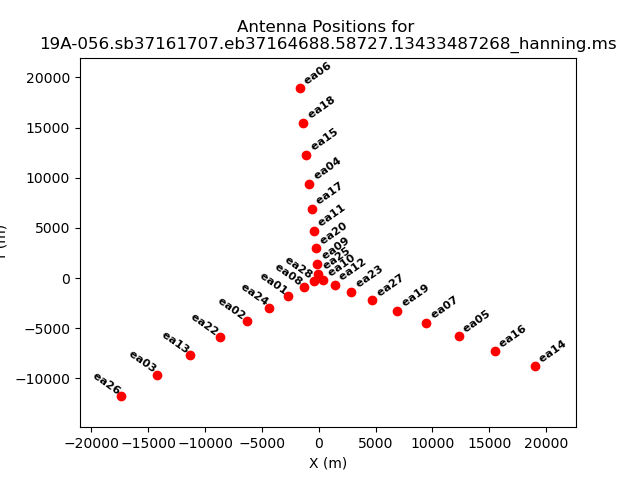

In [3]:
Image(filename=root + "/plots/obsplots/antlayout.png")

### Plot Elevation vs. Time
Observations low in elevation might see more RFI. The plot is colorised by field. Each target field is in between two phase calibrators.

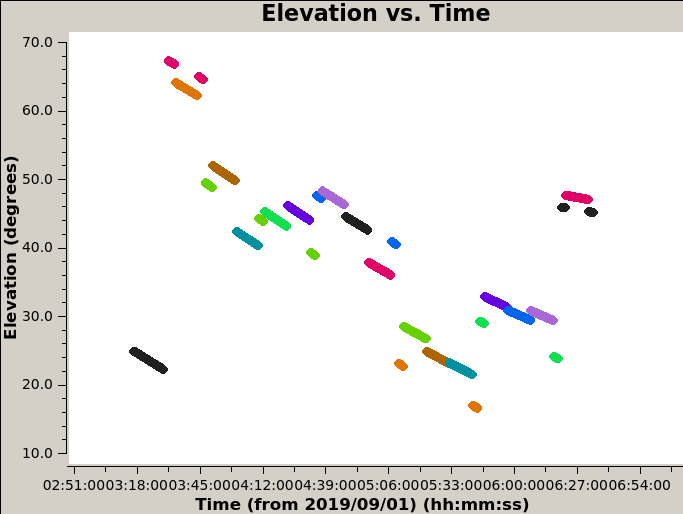

In [4]:
Image(filename=root + "/plots/obsplots/elevation_vs_time.png")

## VLA Deterministic Flags and Manual Flags
These include antennas not on source, shadowed antennas, scans with non-relevant intents, autocorrelations, edge channels of spectral windows, edge channels of the baseband, clipping absolute zero values produced by the correlator and the first few integrations of a scan (quacking). Manual flags are also applied for data known to be bad (RFI, obs reports). Below is a summary of the flags before and after applying the deterministic flags. Use the flagging frequency to find a suitable reference antenna and specify it in the yaml file.

In [5]:
summary_before = np.load(root + "/output/detflag_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + "/output/detflag_summary_after.npy", allow_pickle='TRUE').item()

# print flagging summary
def print_summary(item):
    for subitem in summary_before[item]:
        print(f"{item} {subitem}")
        print(
            "Before: {:.4f}, After: {:.4f}".format(
                100.0 * summary_before[item][subitem]["flagged"] / summary_before[item][subitem]["total"],
                100.0 * summary_after[item][subitem]["flagged"] / summary_after[item][subitem]["total"],
            )
        )
        print("")
        
print("Flag occupancy (percent) before and after deterministic flags:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after deterministic flags:

field 3C286
Before: 16.5544, After: 30.9892

field J1506+3730
Before: 21.1375, After: 34.2920

field J1549+5038
Before: 18.0819, After: 31.7355

field J1609+2641
Before: 17.3525, After: 31.1395

field J1635+3808
Before: 14.6136, After: 28.8592

field J1745+1720
Before: 36.5692, After: 47.2855

field J1927+7358
Before: 22.9660, After: 36.1546

field QSO J1512+4422
Before: 3.8012, After: 20.1041

field QSO J1516+4228
Before: 3.9702, After: 20.0863

field QSO J1525+4303
Before: 5.9035, After: 21.5960

field QSO J1559+2212
Before: 6.3010, After: 21.9293

field QSO J1602+4228
Before: 5.2722, After: 21.0688

field QSO J1603+5510
Before: 3.8318, After: 20.0919

field QSO J1609+3041
Before: 4.3983, After: 20.3430

field QSO J1609+5328
Before: 5.0328, After: 20.8725

field QSO J1612+5559
Before: 3.7809, After: 20.0864

field QSO J1623+3112
Before: 4.4214, After: 20.3632

field QSO J1629+2407
Before: 4.7063, After: 20.5995

field QS

### Plot Online Flags
Plot flaggingreason vs. time. This shows which antennas are flagged due to focus errors, subreflector errors and antenna not on source. This plot can help identify suitable reference antennas.

In [6]:
if os.path.exists(root+"/plots/dataplots/flaggingreason_vs_time.png"):
    Image(filename=root+"/plots/dataplots/flaggingreason_vs_time.png")

### Plot Antenna Data Stream
If an antenna has missing data, it should not be used as a reference.

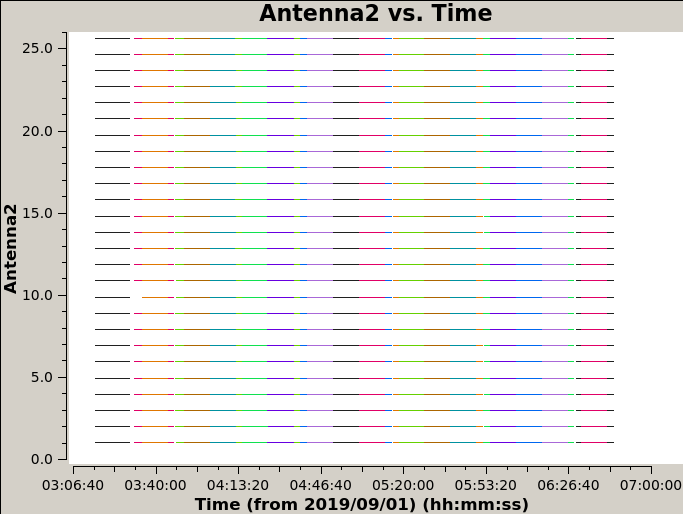

In [7]:
Image(filename=root + "/plots/obsplots/data_stream.png")

## Find Dead Antennas
Antennas that have low power should be flagged. This is also a good time to check for suitable reference antennas.

In [8]:
def plot_dead_ants(ant):
    plotfile = root + f"/plots/dataplots/find_dead_ants_amp_vs_freq_ant_{ant}.png"
    img = mpimg.imread(plotfile)
    plt.imshow(img)
    
interact(plot_dead_ants, ant=(1, 26))
    

interactive(children=(IntSlider(value=13, description='ant', max=26, min=1), Output()), _dom_classes=('widget-…

<function __main__.plot_dead_ants(ant)>

## RFI Inspection
The visibility amplitudes are first averaged across baselines and polarisation products. A modified Z-score is then computed across time as $Z_i = \frac{x_i - \mathrm{med}\{x_i\}_i}{\sigma_\mathrm{MAD}}$, 

where $\sigma_\mathrm{MAD} = \mathrm{med}\{\left|x_i - \mathrm{med}\{x_i\}_i\right|\}$ is the Median Absolute Deviation (MAD), and $x_i$ is the data (visibility amplitude) of the $i^\mathrm{th}$ integration.

The resulting Z-score is a spectrogram with dimensions of time and frequency. It can further be averaged across one of these dimensions to obtain a time series or a spectrum, which are useful for identifying broadband and persistent narrowband RFI respectively.

Use this to identify one clean channel per spectral window which will be used for the initial gain calibration.

#### Load Data

In [9]:

with h5py.File(root + f"/output/z_score_data.h5", "r") as f:
    z_score = f["z-score avg"][()]
    flags = f["flags avg"][()]
    freq_array = f["freq array"][()]
    time_array = f["time array"][()]
    ant_pairs = f["ant pairs"][()]
    dt = f["dt"][()]

# Load time integrations per scan
ntimes_file = os.path.join(root, f"output/ntimes.txt")
ntimes = np.loadtxt(ntimes_file).astype(int)

# time array
tisot = np.unique(Time(time_array, format="jd", scale="utc").isot)

z_score = np.ma.masked_array(z_score, mask=flags)

#### Plot

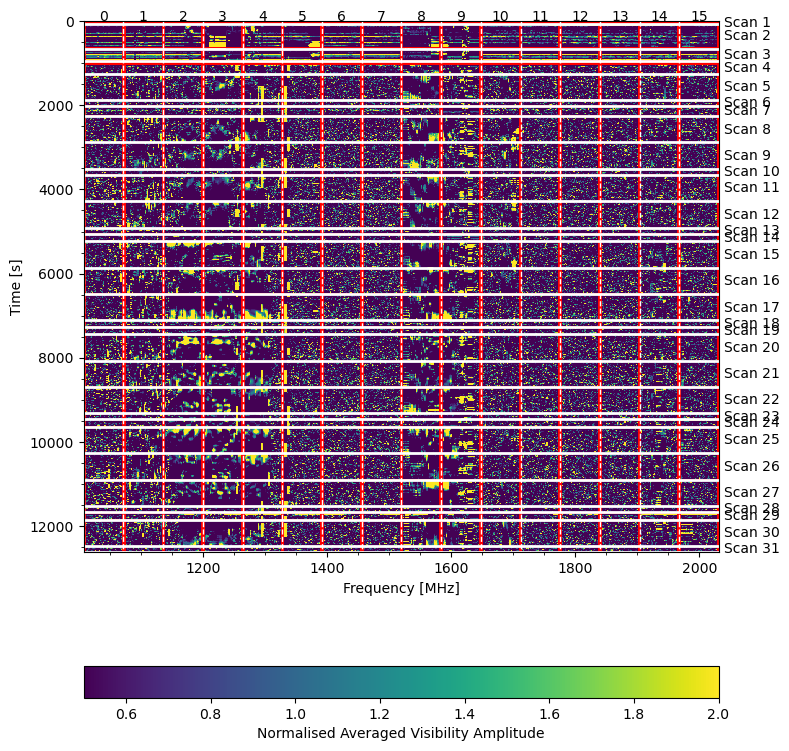

In [10]:
fig, ax = plt.subplots(figsize=(8, 8))
ax, im = inspect.plot_wf(freq_array, z_score, 2, ntimes, vmin=0.5, vmax=2, cmap=cmap, ax=ax, plot_masked=True)
fig.colorbar(im, orientation="horizontal", label="Normalised Averaged Visibility Amplitude")
plt.tight_layout()
plt.show()

In [11]:
def plot_wf_spw(i):
    inspect.plot_wf_spw(freq_array, z_score, i, 2, ntimes, plot_masked=True)
    
interact(plot_wf_spw, i=(0, 15))

interactive(children=(IntSlider(value=7, description='i', max=15), Output()), _dom_classes=('widget-interact',…

<function __main__.plot_wf_spw(i)>

In [12]:
summary_before = np.load(root + "/output/manual_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + "/output/manual_flags_summary_after.npy", allow_pickle='TRUE').item()
        
print("Flag occupancy (percent) before and after manual flags:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after manual flags:

field 3C286
Before: 66.3679, After: 66.3679

field J1506+3730
Before: 66.0699, After: 66.0699

field J1549+5038
Before: 64.2053, After: 64.2053

field J1609+2641
Before: 64.6579, After: 64.6579

field J1635+3808
Before: 62.8766, After: 62.8766

field J1745+1720
Before: 72.8869, After: 72.8869

field J1927+7358
Before: 66.5221, After: 66.5221

field QSO J1512+4422
Before: 58.1010, After: 58.1010

field QSO J1516+4228
Before: 58.0901, After: 58.0901

field QSO J1525+4303
Before: 59.1669, After: 59.1669

field QSO J1559+2212
Before: 59.0566, After: 59.0566

field QSO J1602+4228
Before: 58.9013, After: 58.9013

field QSO J1603+5510
Before: 58.0901, After: 58.0901

field QSO J1609+3041
Before: 58.2253, After: 58.2253

field QSO J1609+5328
Before: 58.5039, After: 58.5039

field QSO J1612+5559
Before: 58.0901, After: 58.0901

field QSO J1623+3112
Before: 59.1716, After: 59.1716

field QSO J1629+2407
Before: 58.6309, After: 58.6309

fiel

## Flux Calibrator Model
Print model flux densities and plot model amplitude vs. uv-distance. If the calibrator is not resolved, its amplitude should be constant across different uv-distances. If it is slightly resolved, the amplitude will decrease as a function of uv-distance.

In [13]:
setjy = np.load(root + "/output/setjy.npy", allow_pickle='TRUE').item()

print("model flux densities in Jy\n")

for spw in range(16):
    print("SPW {:2d}: I: {:.2f}, U: {:.2f}, V: {:.2f}, Q: {:.2f}".format(spw, *setjy["0"][str(spw)]["fluxd"]))

model flux densities in Jy

SPW  0: I: 17.64, U: 0.00, V: 0.00, Q: 0.00
SPW  1: I: 17.15, U: 0.00, V: 0.00, Q: 0.00
SPW  2: I: 16.70, U: 0.00, V: 0.00, Q: 0.00
SPW  3: I: 16.27, U: 0.00, V: 0.00, Q: 0.00
SPW  4: I: 15.86, U: 0.00, V: 0.00, Q: 0.00
SPW  5: I: 15.49, U: 0.00, V: 0.00, Q: 0.00
SPW  6: I: 15.13, U: 0.00, V: 0.00, Q: 0.00
SPW  7: I: 14.79, U: 0.00, V: 0.00, Q: 0.00
SPW  8: I: 14.47, U: 0.00, V: 0.00, Q: 0.00
SPW  9: I: 14.16, U: 0.00, V: 0.00, Q: 0.00
SPW 10: I: 13.87, U: 0.00, V: 0.00, Q: 0.00
SPW 11: I: 13.60, U: 0.00, V: 0.00, Q: 0.00
SPW 12: I: 13.34, U: 0.00, V: 0.00, Q: 0.00
SPW 13: I: 13.09, U: 0.00, V: 0.00, Q: 0.00
SPW 14: I: 12.85, U: 0.00, V: 0.00, Q: 0.00
SPW 15: I: 12.62, U: 0.00, V: 0.00, Q: 0.00


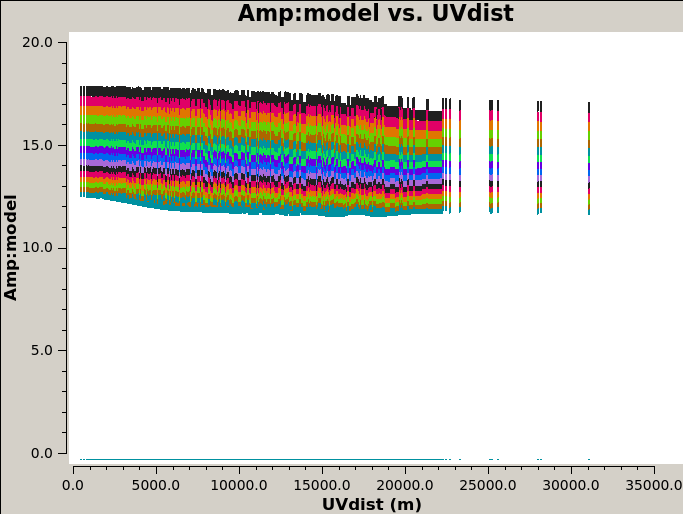

In [14]:
Image(filename=root + "/plots/calplots/setjy_model_amp_vs_uvdist.png")

## Prior Calibration

The prior calibration includes atmospheric opacity corrections, antenna offset corrections and requantizer (rq) gains. These are independent of calibrator observations and use external data instead.

### Weather
Plot weather data and print opacities. For frequencies below 10 GHz the opacity is negligibly small.  

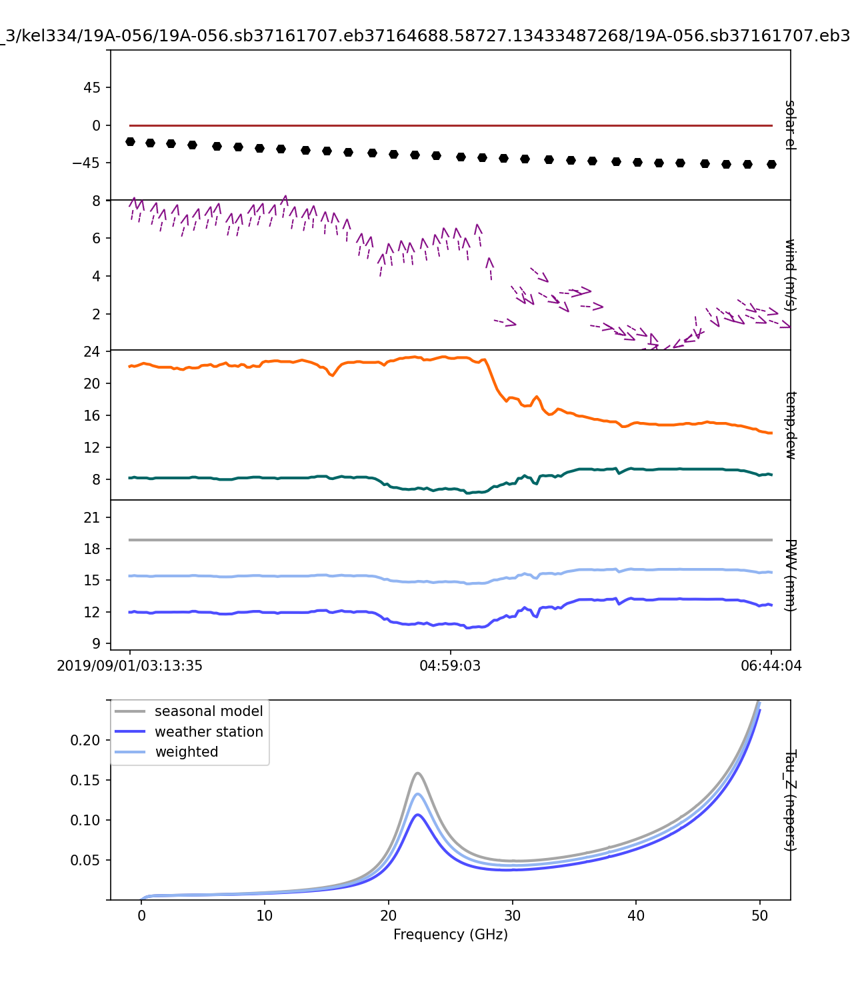

In [15]:
Image(filename=root + "/plots/calplots/weather.png")

In [16]:
opacities = np.load(root + "/output/weather.npy")

print("Opacities [Nepers]\n")

for spw, opacity in enumerate(opacities):
    print(f"SPW {spw}: {opacity}")

Opacities [Nepers]

SPW 0: 0.005155782647513869
SPW 1: 0.005215985325244178
SPW 2: 0.005268413640807923
SPW 3: 0.005314292518940254
SPW 4: 0.0053550596971092155
SPW 5: 0.0053913124234914464
SPW 6: 0.0054239819463204955
SPW 7: 0.0054535428768165825
SPW 8: 0.005480524685947411
SPW 9: 0.005505334261146691
SPW 10: 0.005528262045723238
SPW 11: 0.00554965494705931
SPW 12: 0.005569661814667687
SPW 13: 0.005588562022221216
SPW 14: 0.005606466417203782
SPW 15: 0.005623553487695926


## Plot Calibration Channels
These are the channels that have been selected for the gain calibration. They should be clean and should not exhibit any amplitude jumps.

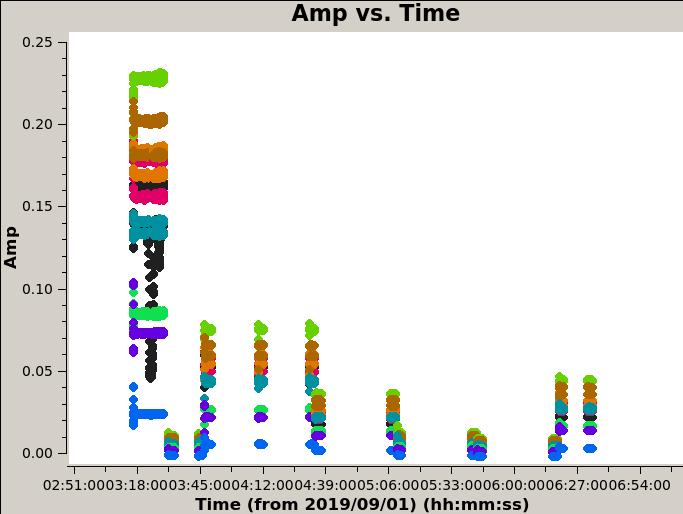

In [17]:
Image(filename=root + "/plots/dataplots/single_chans_amp_vs_time.png")

## Initial Calibration
The initial calibration is done to enable subsequent flagging with automated flagging routines such as CASA's RFlag. The calibration consists of an initial gain phase calibration, a delay calibration, an initial gain phase and amplitude calibration and a bandpass calibration. The two gain calibrations are used for the delay and bandpass calibrations, but are not applied to the data. The gain calibrations are done with a single channel per spectral window.

In [18]:
def plot_two_cols(im1, im2):
    """ 
    Plot two image side by side. E.g phase and amplitude.
    """
    fix, ax = plt.subplots(1, 2, figsize=(15, 5))

    if os.path.exists(im1):
        img_1 = mpimg.imread(im1)
        ax[0].imshow(img_1)

    if os.path.exists(im2):
        img_2 = mpimg.imread(im2)
        ax[1].imshow(img_2)

### Specify Gain Tables

In [19]:
# specify calibration table names
rnd = 0
delay_init_table = f"{name}.p.G{rnd}"
delay_table = f"{name}.K{rnd}"
bandpass_init_table_0 = f"{name}.ap.G{rnd}"
bandpass_table = f"{name}.B{rnd}"

### Delay Initial Gain Calibration
This is an initial per-integration phase calibration and is done to avoid decorrelation under temporal averaging in the subsequent delay calibration. The gain phase should be stable in time. Antennas or spectral windows that have gain phase discontinuities should be flagged. If all but the reference antenna exhibit phase jumps, a difference reference antenna should be chosen.

In [20]:
def plot_delay_init_cal(ant):
    img = mpimg.imread(root + f"/plots/calplots/{delay_init_table}_ant_{ant}_Poln0,1.png")
    imgplot = plt.imshow(img)

interact(plot_delay_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_delay_init_cal(ant)>

### Delay Calibration
The delay calibration is done by fitting for the phase slopes across frequency with respect to the reference antenna. The first and last 15 channels of the spectral windows are not used in this step, since they have lower gains. The delays should lie between -5 and 5 ns, and anything outside that range should be treated with suspicion.

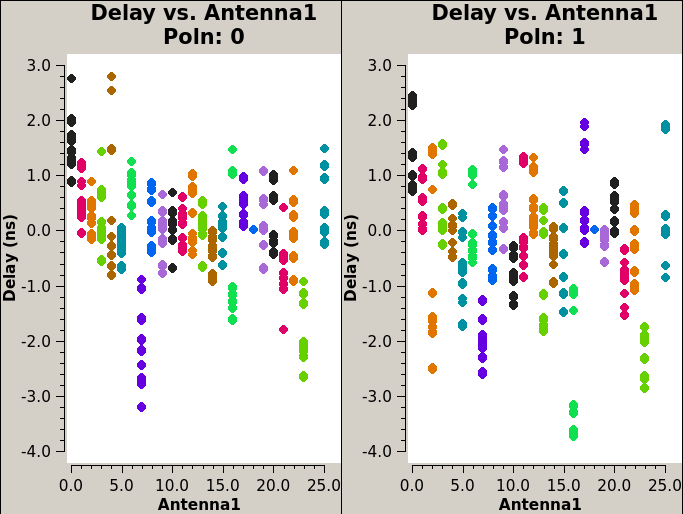

In [21]:
Image(filename=root + f"/plots/calplots/{delay_table}_Poln0,1.png")

### Bandpass Initial Gain Calibration
Similarly to above, we perform an initial gain calibration for the bandpass calibration, but this time we also solve for the amplitudes. The phases and amplitudes should be constant with time and discontinuous solutions should be flagged.

In [22]:
def plot_bandpass_init_cal(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_init_table_0}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_init_table_0}_phase_ant_{ant}_Poln0,1.png"
    )

interact(plot_bandpass_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_init_cal(ant)>

### Bandpass Calibration
The amplitudes and phases of the bandpass calibration should be close to 1 and zero respectively after the initial gain calibration. Discontinuities should be flagged.

In [23]:
def plot_bandpass_ant(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_ant_{ant}_Poln0,1.png"
    )
    
interact(plot_bandpass_ant, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_ant(ant)>

Iterate through spectral windows and colorise by antenna. 

In [24]:
def plot_bandpass_spw(spw):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_spw_{spw}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_spw_{spw}_Poln0,1.png"
    )

interact(plot_bandpass_spw, spw=(0, conf["spw"]-1))

interactive(children=(IntSlider(value=7, description='spw', max=15), Output()), _dom_classes=('widget-interact…

<function __main__.plot_bandpass_spw(spw)>

### Plot Corrected Data
This data is averaged in time and colorised by antenna.

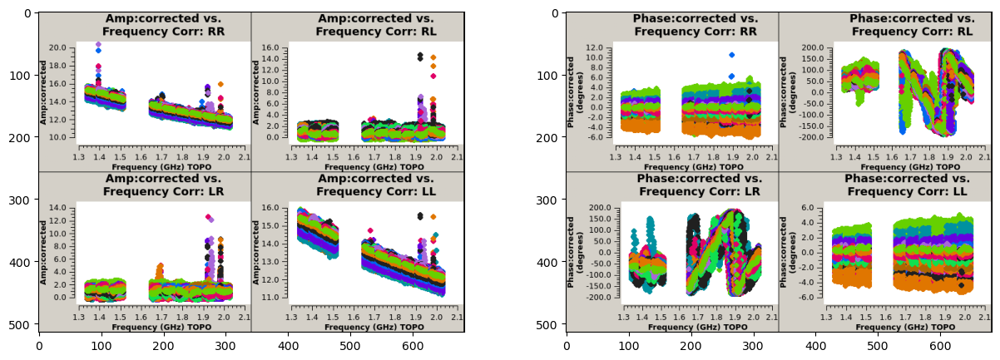

In [25]:
plot_two_cols(
    root + f"/plots/dataplots/fluxcal_initcal_round_0_amp_vs_freq_CorrRR,RL,LR,LL.png",
    root + f"/plots/dataplots/fluxcal_initcal_round_0_phase_vs_freq_CorrRR,RL,LR,LL.png"
)

#### Plot Averaged Corrected Data
Iterate through spectral windows to identify RFI and flag bad channels manually below.

In [26]:
def plot_corrected_spw(spw):
    img = mpimg.imread(root + f"/plots/dataplots/fluxcal_initcal_round_0_amp_vs_freq_avg_spw_{spw}_CorrRR,RL,LR,LL.png")
    plt.imshow(img)

interact(plot_corrected_spw, spw=(0, conf["spw"]-1))

interactive(children=(IntSlider(value=7, description='spw', max=15), Output()), _dom_classes=('widget-interact…

<function __main__.plot_corrected_spw(spw)>

### Flagging Summary
If no calibration solutions are available, data may be flagged (e.g. bad spectral windows).

In [27]:
rnd=0
summary_before = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print(f"Flag occupancy (percent) before and after initial calibration round {rnd}:\n")

print_summary("field")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after initial calibration round 0:

field 3C286
Before: 33.8146, After: 66.3679

antenna ea01
Before: 30.3004, After: 63.4768

antenna ea02
Before: 30.3041, After: 63.4768

antenna ea03
Before: 30.3004, After: 63.4768

antenna ea04
Before: 30.3004, After: 63.4768

antenna ea05
Before: 30.3004, After: 63.4768

antenna ea06
Before: 30.3041, After: 63.4768

antenna ea07
Before: 30.3004, After: 63.4768

antenna ea08
Before: 30.3004, After: 63.4768

antenna ea09
Before: 30.3004, After: 63.4768

antenna ea10
Before: 30.3041, After: 63.4768

antenna ea11
Before: 30.3004, After: 63.4768

antenna ea12
Before: 30.3004, After: 63.4768

antenna ea13
Before: 30.3004, After: 63.4768

antenna ea14
Before: 30.3041, After: 63.4768

antenna ea15
Before: 30.3004, After: 63.4768

antenna ea16
Before: 34.5710, After: 67.7474

antenna ea17
Before: 30.3004, After: 63.4768

antenna ea18
Before: 30.6754, After: 63.8482

antenna ea19
Before: 30.3004, After: 63.4768

antenna e

## First Round of Flagging on Primary Calibrator
The first round of flagging is performed on the primary calibrator only. The flagging routine runs RFlag with timedevscale=5.0, freqdevscale=5.0 and freqfit=line on a ABS_RL, ABS_LR, ABS_LL, ABS_RR, REAL_LL, REAL_RR, IMAG_LL and IMAG_RR, where for the real and imaginary parts RFLag is performed on the residual (corrected-model) data. TFCrop is run with timecutoff=4.0 and freqcutoff=4.0 on ABS_RL, ABS_LR, ABS_LL and ABS_RR. Flags are extended across polarisations. The plots below show the amplitudes and phases of the calibrators before and after flagging respectively.

### Before Flagging

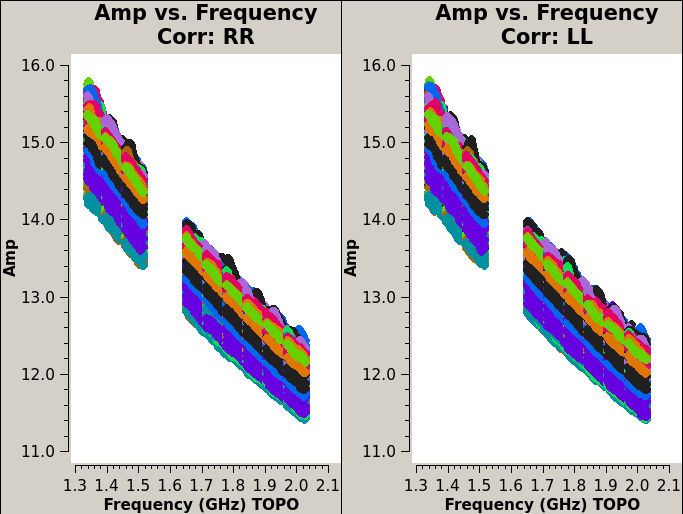

In [28]:
Image(filename=root + "/plots/dataplots/before_fluxcal_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

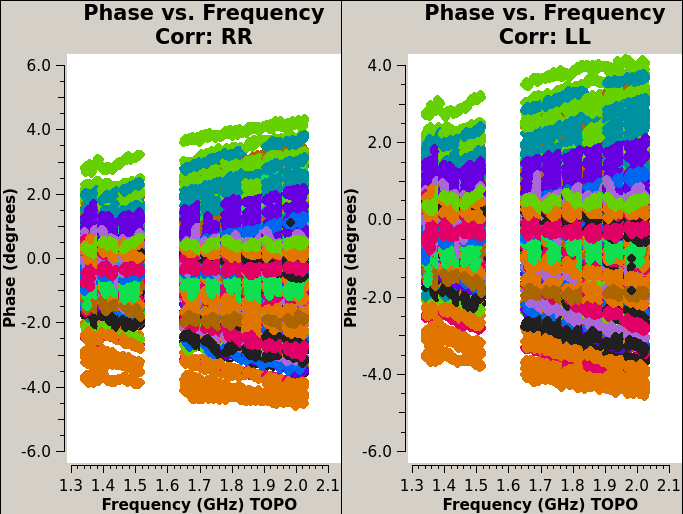

In [29]:
Image(filename=root + "/plots/dataplots/before_fluxcal_round_0_flagging_phase_vs_freq_CorrRR,LL.png")

### After Flagging

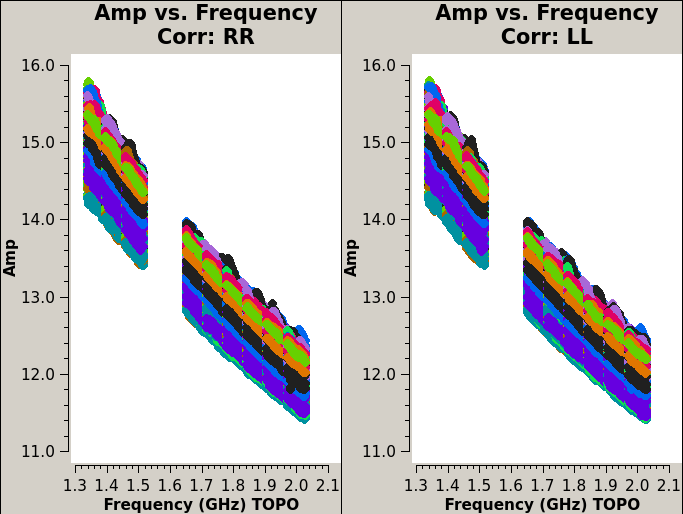

In [30]:
Image(filename=root + "/plots/dataplots/after_fluxcal_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

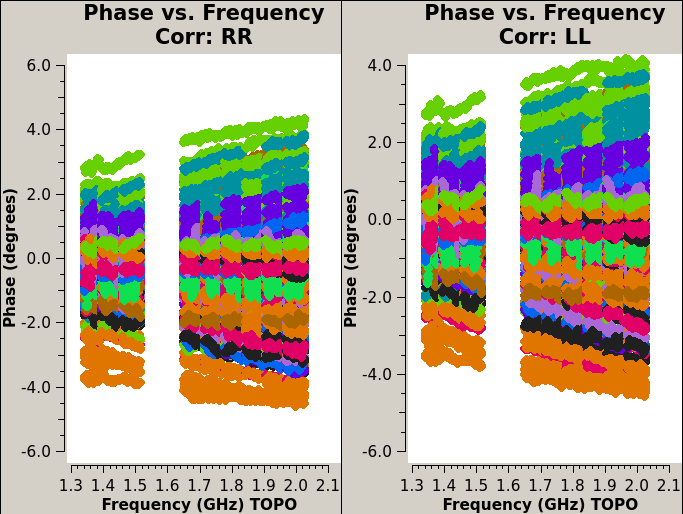

In [31]:
Image(filename=root + "/plots/dataplots/after_fluxcal_round_0_flagging_phase_vs_freq_CorrRR,LL.png")

### Summary

In [32]:
summary_before = np.load(root + f"/output/fluxcal_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/fluxcal_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print("Flag occupancy (percent) before and after flagging the flux calibrator:\n")

print_summary("field")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after flagging the flux calibrator:

field 3C286
Before: 66.3679, After: 66.4352

antenna ea01
Before: 63.4768, After: 63.5560

antenna ea02
Before: 63.4768, After: 63.5323

antenna ea03
Before: 63.4768, After: 63.4865

antenna ea04
Before: 63.4768, After: 63.4803

antenna ea05
Before: 63.4768, After: 63.4829

antenna ea06
Before: 63.4768, After: 63.4980

antenna ea07
Before: 63.4768, After: 63.4829

antenna ea08
Before: 63.4768, After: 63.5564

antenna ea09
Before: 63.4768, After: 63.5166

antenna ea10
Before: 63.4768, After: 63.6520

antenna ea11
Before: 63.4768, After: 63.4918

antenna ea12
Before: 63.4768, After: 63.5496

antenna ea13
Before: 63.4768, After: 63.5483

antenna ea14
Before: 63.4768, After: 63.4918

antenna ea15
Before: 63.4768, After: 63.4841

antenna ea16
Before: 67.7474, After: 67.7560

antenna ea17
Before: 63.4768, After: 63.4954

antenna ea18
Before: 63.8482, After: 64.2205

antenna ea19
Before: 63.4768, After: 63.4836

antenna 

## Semi-Final Calibration
The steps from the intitial calibration are repeated. 

### Specify Gain Tables

In [33]:
# specify calibration table names
rnd = 1
delay_init_table = f"{name}.p.G{rnd}"
delay_table = f"{name}.K{rnd}"
bandpass_init_table_1 = f"{name}.ap.G{rnd}"
bandpass_table = f"{name}.B{rnd}"

### Delay Initial Gain Calibration

In [34]:
def plot_delay_init_cal(ant):
    img = mpimg.imread(root + f"/plots/calplots/{delay_init_table}_ant_{ant}_Poln0,1.png")
    imgplot = plt.imshow(img)

interact(plot_delay_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_delay_init_cal(ant)>

### Delay Calibration

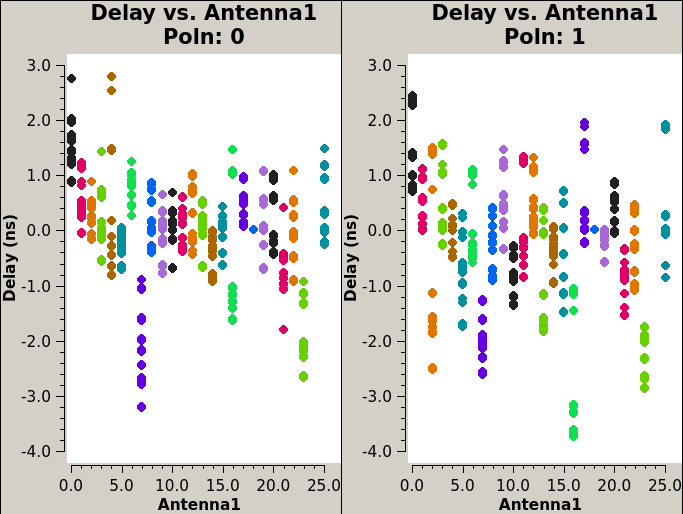

In [35]:
Image(filename=root + f"/plots/calplots/{delay_table}_Poln0,1.png")

### Bandpass Initial Gain Calibration

In [36]:
def plot_bandpass_init_cal(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_init_table_1}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_init_table_1}_phase_ant_{ant}_Poln0,1.png"
    )

interact(plot_bandpass_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_init_cal(ant)>

### Bandpass Calibration

In [37]:
def plot_bandpass_ant(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_ant_{ant}_Poln0,1.png"
    )
    
interact(plot_bandpass_ant, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_ant(ant)>

Iterate through spectral windows and colorise by antenna. 

In [38]:
def plot_bandpass_spw(spw):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_spw_{spw}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_spw_{spw}_Poln0,1.png"
    )

interact(plot_bandpass_spw, spw=(0, conf["spw"]-1))

interactive(children=(IntSlider(value=7, description='spw', max=15), Output()), _dom_classes=('widget-interact…

<function __main__.plot_bandpass_spw(spw)>

### Flagging Summary
If no calibration solutions are available, data may be flagged (e.g. bad spectral windows).

In [39]:
rnd=1
summary_before = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print(f"Flag occupancy (percent) before and after initial calibration round {rnd}:\n")

print_summary("field")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after initial calibration round 1:

field 3C286
Before: 66.4352, After: 66.4352

antenna ea01
Before: 63.5560, After: 63.5560

antenna ea02
Before: 63.5323, After: 63.5323

antenna ea03
Before: 63.4865, After: 63.4865

antenna ea04
Before: 63.4803, After: 63.4803

antenna ea05
Before: 63.4829, After: 63.4829

antenna ea06
Before: 63.4980, After: 63.4980

antenna ea07
Before: 63.4829, After: 63.4829

antenna ea08
Before: 63.5564, After: 63.5564

antenna ea09
Before: 63.5166, After: 63.5166

antenna ea10
Before: 63.6520, After: 63.6520

antenna ea11
Before: 63.4918, After: 63.4918

antenna ea12
Before: 63.5496, After: 63.5496

antenna ea13
Before: 63.5483, After: 63.5483

antenna ea14
Before: 63.4918, After: 63.4918

antenna ea15
Before: 63.4841, After: 63.4841

antenna ea16
Before: 67.7560, After: 67.7560

antenna ea17
Before: 63.4954, After: 63.4954

antenna ea18
Before: 64.2205, After: 64.2205

antenna ea19
Before: 63.4836, After: 63.4836

antenna e

## Second Round of Flagging
The flagging is repeated, but this time on all calibrators.

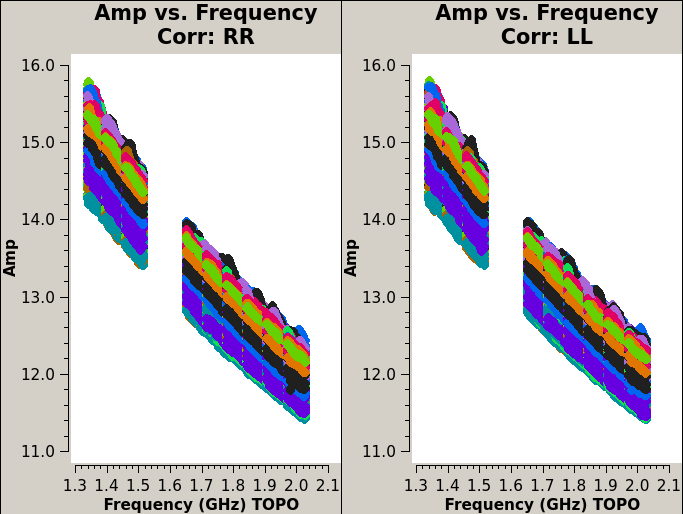

In [40]:
# primary calibrator
Image(filename=root + "/plots/dataplots/before_fluxcal_round_1_flagging_amp_vs_freq_CorrRR,LL.png")

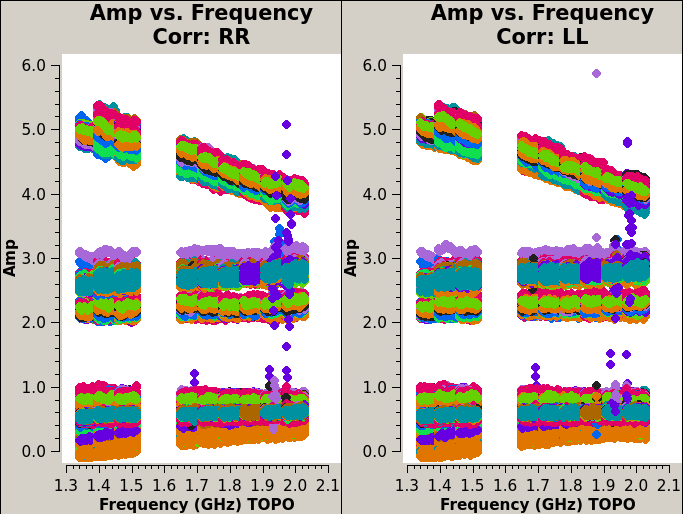

In [41]:
# phase calibrators
Image(filename=root + "/plots/dataplots/before_phasecal_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

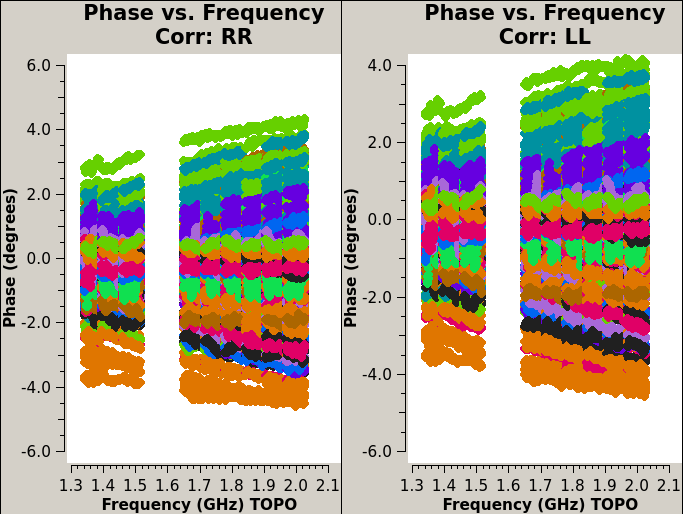

In [42]:
# primary calibrator
Image(filename=root + "/plots/dataplots/before_fluxcal_round_1_flagging_phase_vs_freq_CorrRR,LL.png")

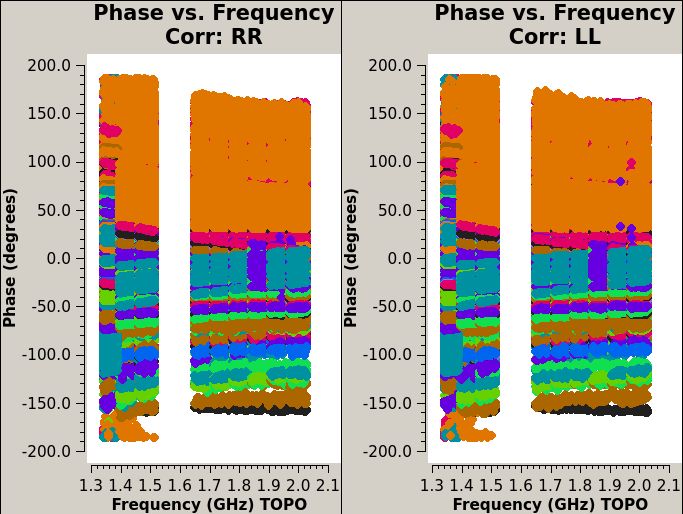

In [43]:
# phase calibrators
Image(filename=root + "/plots/dataplots/before_phasecal_round_0_flagging_phase_vs_freq_CorrRR,LL.png")

### After Flagging

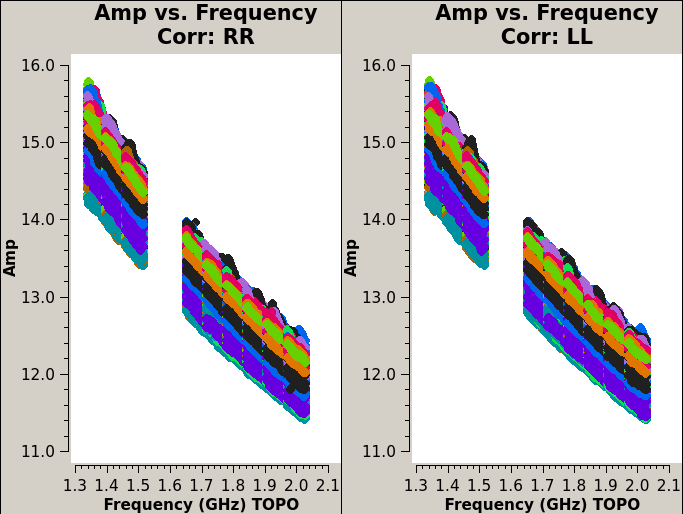

In [44]:
# primary calibrator
Image(filename=root + "/plots/dataplots/after_fluxcal_round_1_flagging_amp_vs_freq_CorrRR,LL.png")

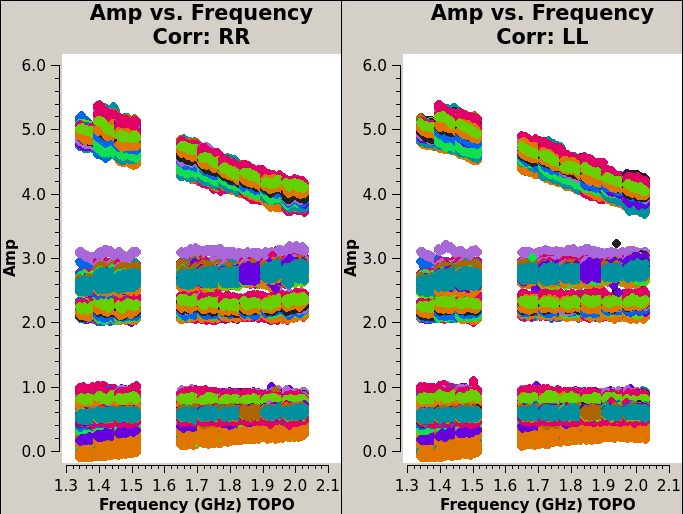

In [45]:
# phase calibrators
Image(filename=root + "/plots/dataplots/after_phasecal_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

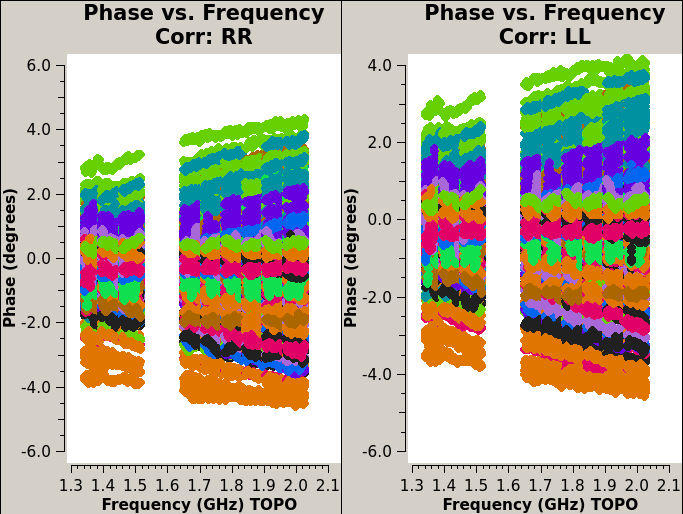

In [46]:
# primary calibrator
Image(filename=root + "/plots/dataplots/after_fluxcal_round_1_flagging_phase_vs_freq_CorrRR,LL.png")

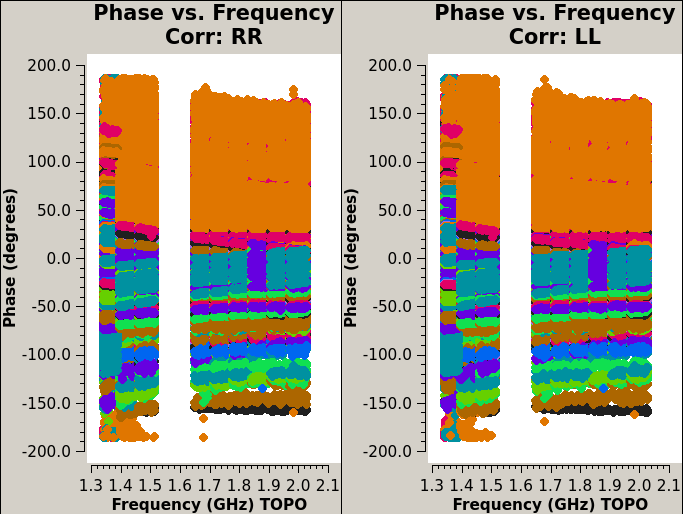

In [47]:
# phase calibrators
Image(filename=root + "/plots/dataplots/after_phasecal_round_0_flagging_phase_vs_freq_CorrRR,LL.png")

### Flagging Summary

In [48]:
summary_before = np.load(root + f"/output/fluxcal_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/fluxcal_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print("Flag occupancy (percent) before and after flagging the flux calibrator:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after flagging the flux calibrator:

field 3C286
Before: 66.4352, After: 66.4662

scan 1
Before: 100.0000, After: 100.0000

scan 2
Before: 65.2164, After: 65.2494

scan 3
Before: 62.5393, After: 62.5722

antenna ea01
Before: 63.5560, After: 63.6146

antenna ea02
Before: 63.5323, After: 63.5754

antenna ea03
Before: 63.4865, After: 63.5060

antenna ea04
Before: 63.4803, After: 63.4907

antenna ea05
Before: 63.4829, After: 63.5039

antenna ea06
Before: 63.4980, After: 63.5363

antenna ea07
Before: 63.4829, After: 63.4943

antenna ea08
Before: 63.5564, After: 63.6009

antenna ea09
Before: 63.5166, After: 63.5461

antenna ea10
Before: 63.6520, After: 63.7051

antenna ea11
Before: 63.4918, After: 63.5146

antenna ea12
Before: 63.5496, After: 63.6261

antenna ea13
Before: 63.5483, After: 63.5785

antenna ea14
Before: 63.4918, After: 63.5369

antenna ea15
Before: 63.4841, After: 63.5056

antenna ea16
Before: 67.7560, After: 67.7825

antenna ea17
Before: 63.

In [49]:
summary_before = np.load(root + f"/output/phasecal_round_0_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/phasecal_round_0_flags_summary_after.npy", allow_pickle='TRUE').item()

print("Flag occupancy (percent) before and after flagging the phase calibrators:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after flagging the phase calibrators:

field J1506+3730
Before: 66.0699, After: 66.2772

field J1549+5038
Before: 64.2053, After: 64.4403

field J1609+2641
Before: 64.6579, After: 64.8262

field J1635+3808
Before: 62.8766, After: 63.0880

field J1745+1720
Before: 72.8869, After: 73.1184

field J1927+7358
Before: 66.5221, After: 66.9006

scan 10
Before: 61.6873, After: 61.8540

scan 13
Before: 62.8310, After: 63.0090

scan 14
Before: 63.8654, After: 64.0613

scan 18
Before: 61.6873, After: 61.9176

scan 19
Before: 70.0463, After: 70.1919

scan 23
Before: 61.2874, After: 61.5689

scan 24
Before: 66.0619, After: 66.2929

scan 28
Before: 61.9974, After: 62.2374

scan 29
Before: 72.4106, After: 72.7193

scan 31
Before: 59.4235, After: 59.8864

scan 4
Before: 77.5971, After: 77.7996

scan 6
Before: 63.4028, After: 63.6928

scan 7
Before: 67.6411, After: 67.8046

antenna ea01
Before: 63.3461, After: 63.6845

antenna ea02
Before: 63.3579, After: 63.5627

ant

## Final Calibration
First, the initial calibration (delay and bandpass) are repeated on the primary calibrator. Then, the final gains of the calibrators are derived.

### Specify Gain Tables

In [50]:
# specify calibration table names
rnd = 2
delay_init_table = f"{name}.p.G{rnd}"
delay_table = f"{name}.K{rnd}"
bandpass_init_table = f"{name}.ap.G{rnd}"
bandpass_table = f"{name}.B{rnd}"

fluxcal_phase_table = f"{name}_fluxcal_phase.Gfinal"
short_gain_table = f"{name}_short.Gfinal"
amp_gain_table = f"{name}.fluxscale"
phase_gain_table = f"{name}_phase.Gfinal"

### Delay Initial Gain Calibration

In [51]:
def plot_delay_init_cal(ant):
    img = mpimg.imread(root + f"/plots/calplots/{delay_init_table}_ant_{ant}_Poln0,1.png")
    imgplot = plt.imshow(img)

interact(plot_delay_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_delay_init_cal(ant)>

### Delay Calibration

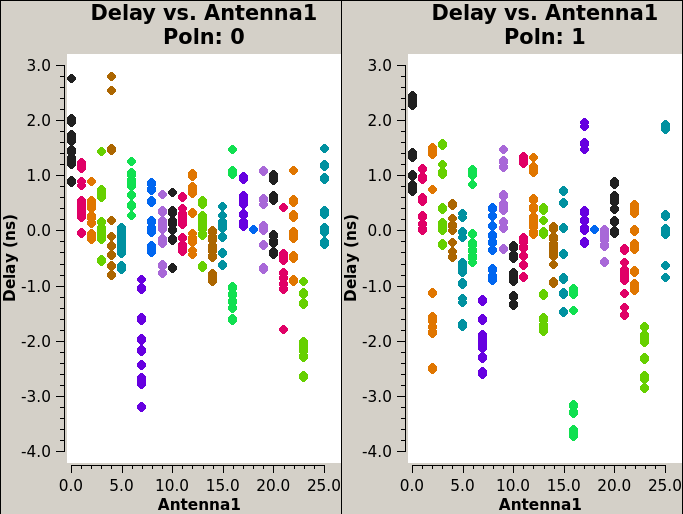

In [52]:
Image(filename=root + f"/plots/calplots/{delay_table}_Poln0,1.png")

### Bandpass Initial Gain Calibration

In [53]:
def plot_bandpass_init_cal(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_init_table}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_init_table}_phase_ant_{ant}_Poln0,1.png"
    )

interact(plot_bandpass_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_init_cal(ant)>

### Bandpass Calibration

In [54]:
def plot_bandpass_ant(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_ant_{ant}_Poln0,1.png"
    )
    
interact(plot_bandpass_ant, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_ant(ant)>

Iterate through spectral windows and colorise by antenna. 

In [55]:
def plot_bandpass_spw(spw):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_spw_{spw}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_spw_{spw}_Poln0,1.png"
    )

interact(plot_bandpass_spw, spw=(0, conf["spw"]-1))

interactive(children=(IntSlider(value=7, description='spw', max=15), Output()), _dom_classes=('widget-interact…

<function __main__.plot_bandpass_spw(spw)>

### Flux Calibrator Final Gain Phase

In [56]:
def plot_final_fluxcal_phase(ant):
    img = mpimg.imread(root + f'/plots/calplots/{fluxcal_phase_table}_ant_{ant}_Poln0,1.png')
    plt.imshow(img)

interact(plot_final_fluxcal_phase, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_final_fluxcal_phase(ant)>

### Short Interval Gain Calibration
This is an initial calibration done on a per-integration basis on the calibrators.

In [57]:
def plot_final_short_gain_phase(ant):
    img = mpimg.imread(root + f'/plots/calplots/{short_gain_table}_phase_ant_{ant}_Poln0,1.png')
    plt.imshow(img)

interact(plot_final_short_gain_phase, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_final_short_gain_phase(ant)>

### Long Interval Gain Calibration
The gain amplitudes of the calibrators of solved for using the initial gain phase calibration above.

In [58]:
def plot_final_long_gain(ant):
    plot_two_cols(
        root + f'/plots/calplots/{amp_gain_table}_amp_ant_{ant}_Poln0,1.png',
        root + f'/plots/calplots/{amp_gain_table}_phase_ant_{ant}_Poln0,1.png'
    )
interact(plot_final_long_gain, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_final_long_gain(ant)>

### Phase Calibration
Derive the final gain phases of the calibrators. That of the primary calibrator should be close to zero, since it was already derived and applied earlier on.

In [59]:
def plot_final_phase(ant):
    img = mpimg.imread(root + f'/plots/calplots/{phase_gain_table}_phase_ant_{ant}_Poln0,1.png')
    plt.imshow(img)

interact(plot_final_phase, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_final_phase(ant)>

### Flagging Summary

In [60]:
rnd=1
summary_before = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print(f"Flag occupancy (percent) before and after final delay and bandpass calibration:\n")

print_summary("field")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after final delay and bandpass calibration:

field 3C286
Before: 66.4352, After: 66.4352

antenna ea01
Before: 63.5560, After: 63.5560

antenna ea02
Before: 63.5323, After: 63.5323

antenna ea03
Before: 63.4865, After: 63.4865

antenna ea04
Before: 63.4803, After: 63.4803

antenna ea05
Before: 63.4829, After: 63.4829

antenna ea06
Before: 63.4980, After: 63.4980

antenna ea07
Before: 63.4829, After: 63.4829

antenna ea08
Before: 63.5564, After: 63.5564

antenna ea09
Before: 63.5166, After: 63.5166

antenna ea10
Before: 63.6520, After: 63.6520

antenna ea11
Before: 63.4918, After: 63.4918

antenna ea12
Before: 63.5496, After: 63.5496

antenna ea13
Before: 63.5483, After: 63.5483

antenna ea14
Before: 63.4918, After: 63.4918

antenna ea15
Before: 63.4841, After: 63.4841

antenna ea16
Before: 67.7560, After: 67.7560

antenna ea17
Before: 63.4954, After: 63.4954

antenna ea18
Before: 64.2205, After: 64.2205

antenna ea19
Before: 63.4836, After: 63.4836



In [61]:
summary_before = np.load(root + f"/output/applycal_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/applycal_summary_after.npy", allow_pickle='TRUE').item()

print("Flag occupancy (percent) before and after applying final calibration:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after applying final calibration:

field 3C286
Before: 66.4662, After: 66.9742

field J1506+3730
Before: 66.2772, After: 66.2772

field J1549+5038
Before: 64.4403, After: 64.4403

field J1609+2641
Before: 64.8262, After: 64.8262

field J1635+3808
Before: 63.0880, After: 63.0880

field J1745+1720
Before: 73.1184, After: 73.6162

field J1927+7358
Before: 66.9006, After: 66.9006

field QSO J1512+4422
Before: 58.1010, After: 58.1010

field QSO J1516+4228
Before: 58.0901, After: 58.0901

field QSO J1525+4303
Before: 59.1669, After: 59.1669

field QSO J1559+2212
Before: 59.0566, After: 59.0566

field QSO J1602+4228
Before: 58.9013, After: 58.9013

field QSO J1603+5510
Before: 58.0901, After: 58.0901

field QSO J1609+3041
Before: 58.2253, After: 58.2253

field QSO J1609+5328
Before: 58.5039, After: 58.5039

field QSO J1612+5559
Before: 58.0901, After: 58.0901

field QSO J1623+3112
Before: 59.1716, After: 59.1716

field QSO J1629+2407
Before: 58.6309, After:

## Target Flags
Now that the final calibration tables have been derived and applied to the data, the automated flagging routine is run on the target fields.

### Before Flagging

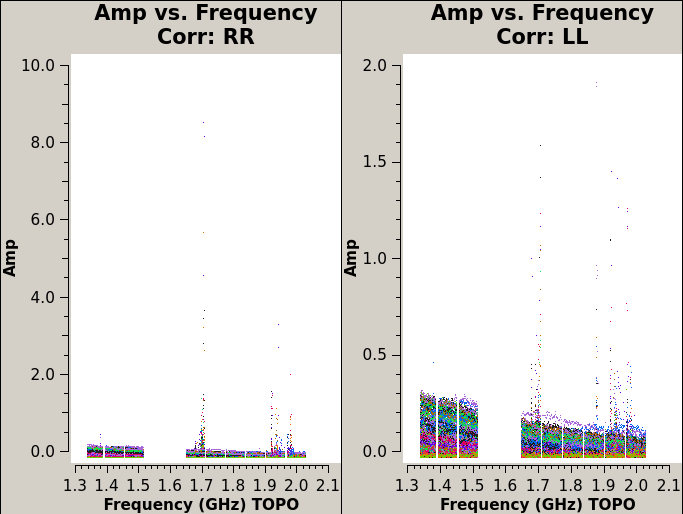

In [62]:
Image(filename=root + "/plots/dataplots/before_targets_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

### After Flagging

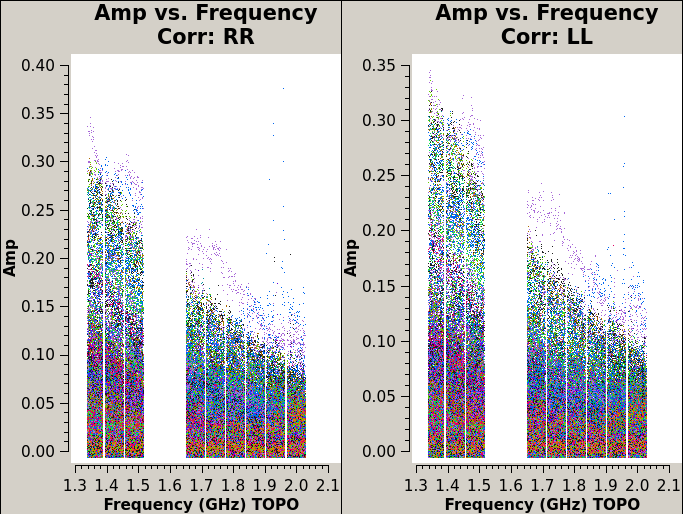

In [63]:
Image(filename=root + "/plots/dataplots/after_targets_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

### Summary

In [64]:
rnd=0
summary_before = np.load(root + f"/output/targets_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/targets_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print("Flag occupancy (percent) after flagging the flux calibrator:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) after flagging the flux calibrator:

field QSO J1512+4422
Before: 58.1010, After: 58.3640

field QSO J1516+4228
Before: 58.0901, After: 58.3224

field QSO J1525+4303
Before: 59.1669, After: 59.3936

field QSO J1559+2212
Before: 59.0566, After: 59.2808

field QSO J1602+4228
Before: 58.9013, After: 59.1663

field QSO J1603+5510
Before: 58.0901, After: 58.3801

field QSO J1609+3041
Before: 58.2253, After: 58.4386

field QSO J1609+5328
Before: 58.5039, After: 58.8064

field QSO J1612+5559
Before: 58.0901, After: 58.3573

field QSO J1623+3112
Before: 59.1716, After: 59.4291

field QSO J1629+2407
Before: 58.6309, After: 58.9468

field QSO J1630+4012
Before: 58.0901, After: 58.3483

field QSO J1641+3755
Before: 58.0901, After: 58.3808

field QSO J1724+1901
Before: 62.4547, After: 62.7744

field QSO J1932+7139
Before: 58.0888, After: 58.6422

scan 11
Before: 58.2253, After: 58.4386

scan 12
Before: 59.1716, After: 59.4291

scan 15
Before: 58.0901, After: 58.3808

scan 

## Summary Plots
These plots show the corrected amplitudes and phases of all fields as a function of uv-distance and frequency. The values plotted against uv-distance are colorised by spectral window while those plotted against frequency are colorised by antenna number. Remaining RFI should be flagged manually in CASA.

In [65]:
field_dict = vladata.get_field_names(ms)
fields = field_dict["calibrators"] + "," + field_dict["targets"]

3C286


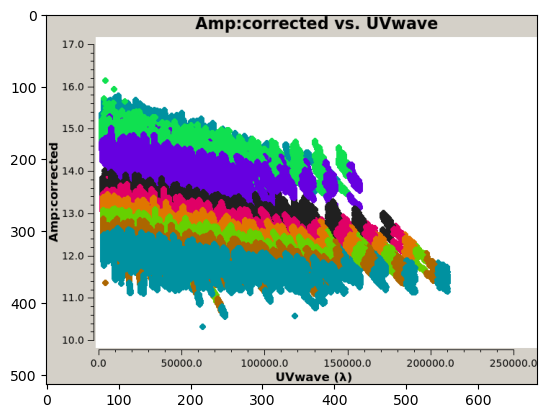

J1745+1720


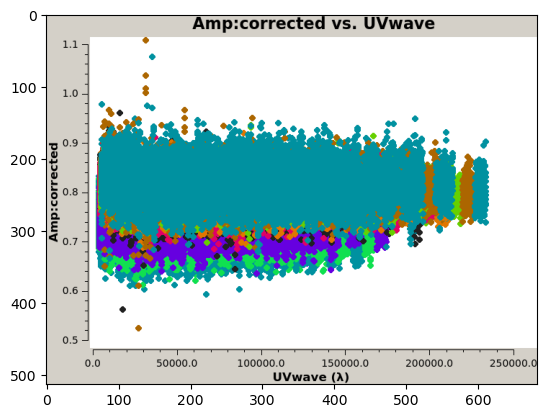

J1609+2641


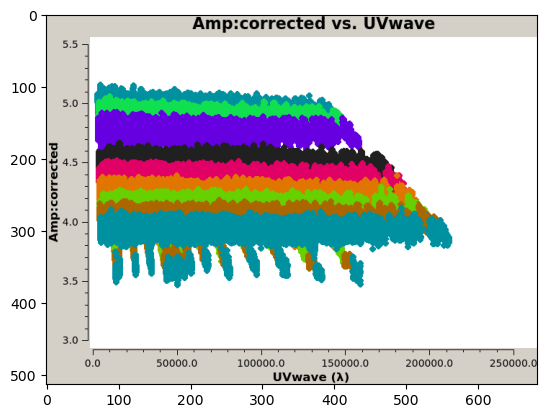

J1635+3808


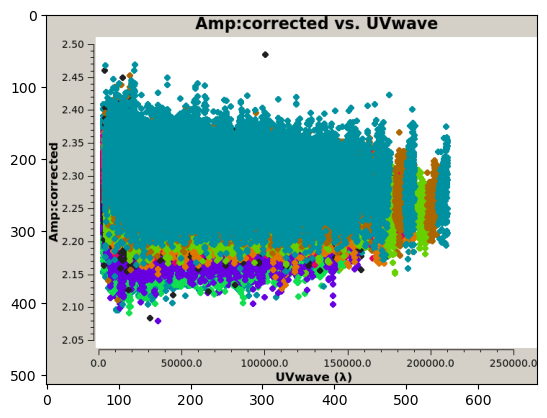

J1506+3730


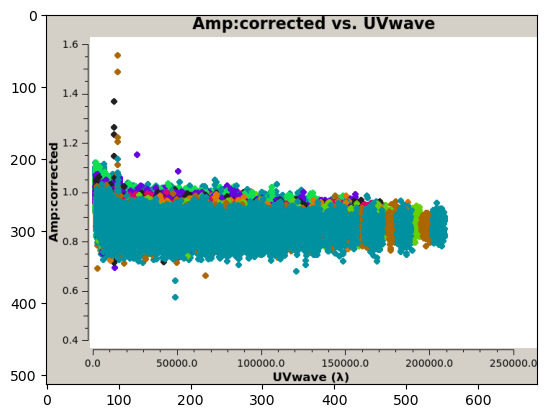

J1549+5038


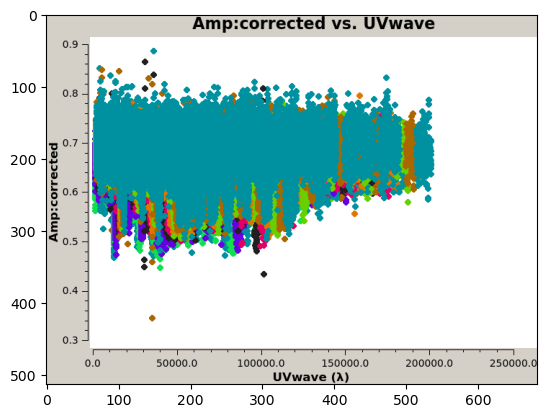

J1927+7358


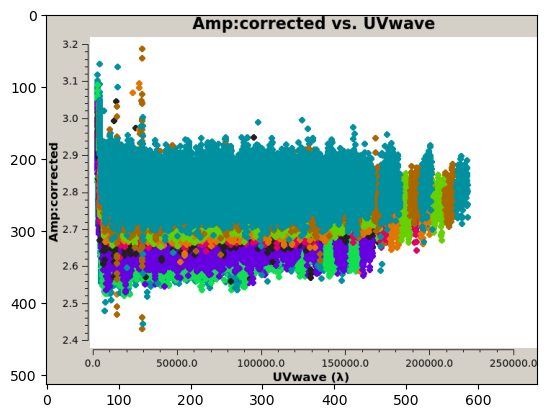

QSO J1724+1901


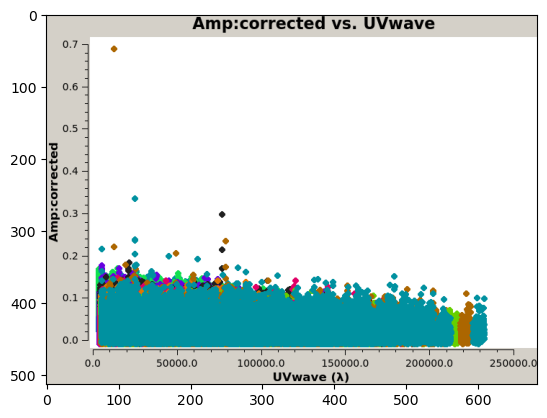

QSO J1629+2407


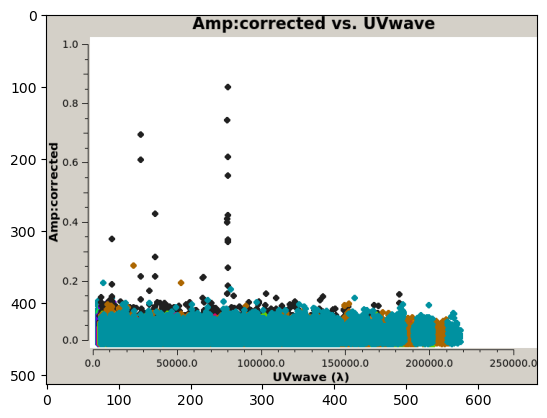

QSO J1559+2212


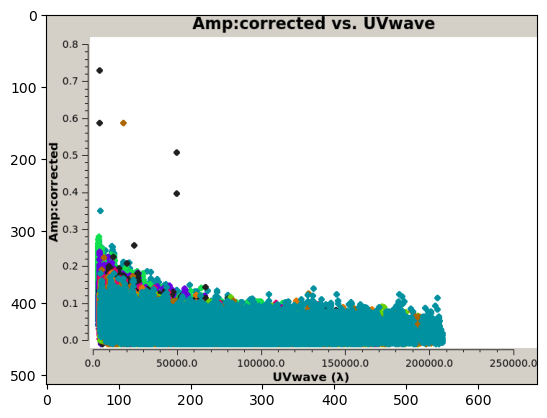

QSO J1609+3041


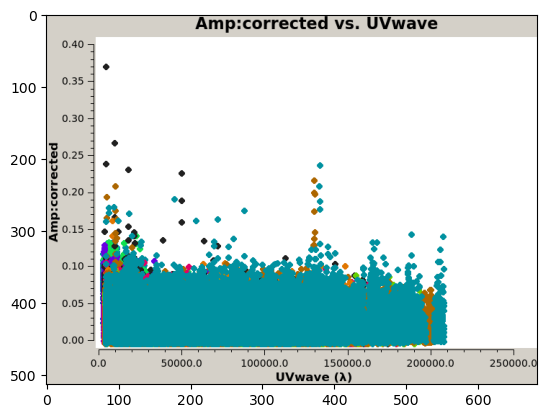

QSO J1623+3112


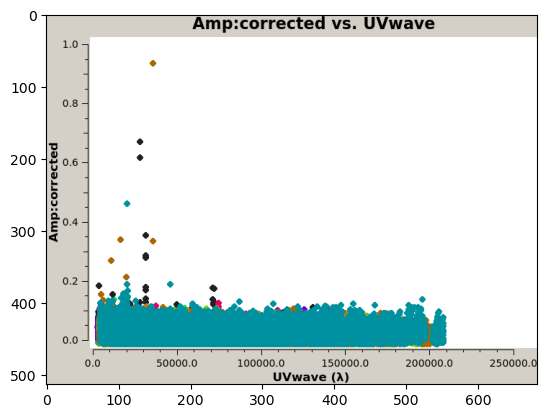

QSO J1641+3755


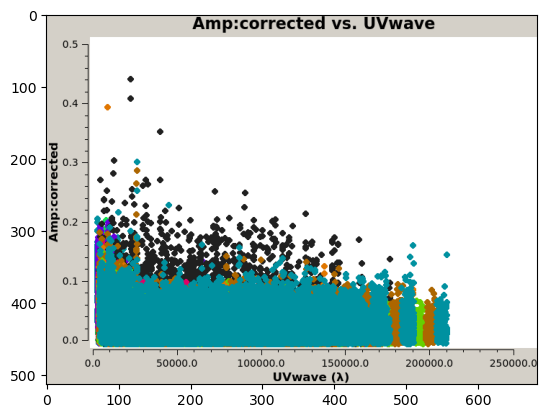

QSO J1630+4012


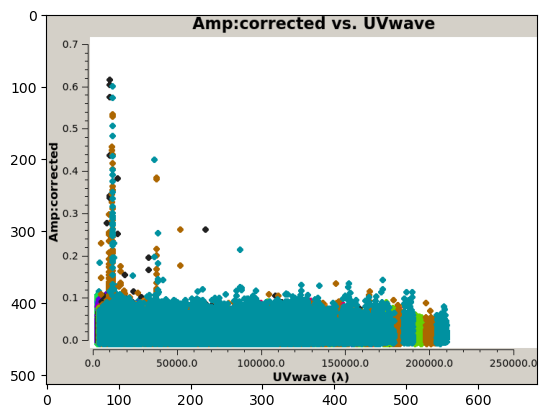

QSO J1602+4228


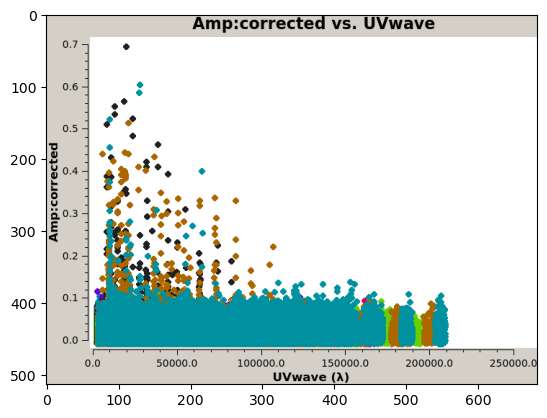

QSO J1525+4303


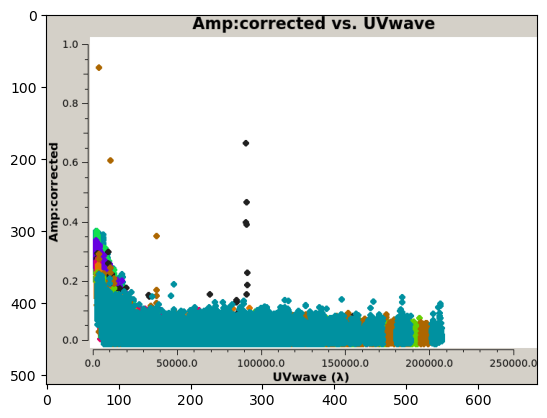

QSO J1516+4228


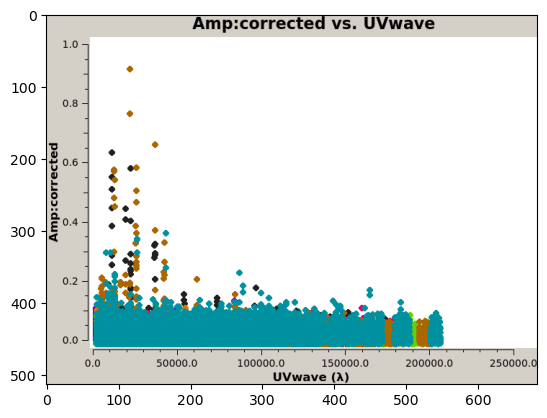

QSO J1512+4422


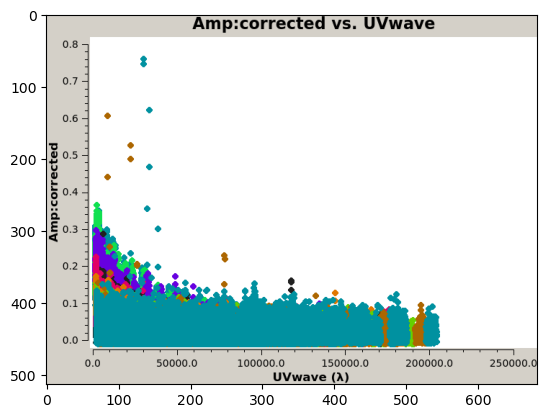

QSO J1609+5328


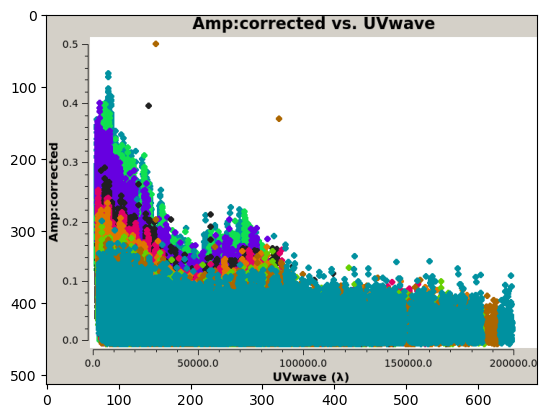

QSO J1603+5510


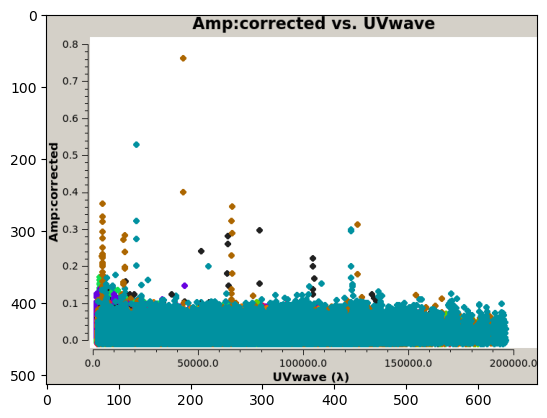

QSO J1612+5559


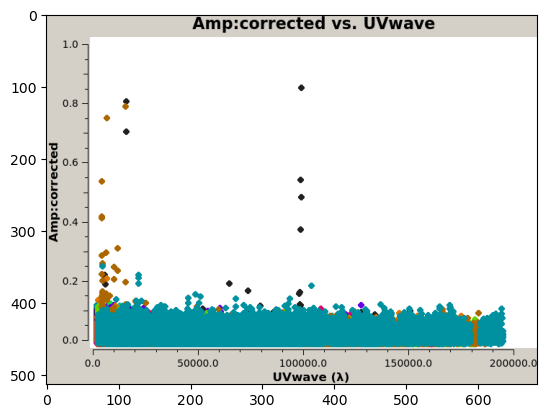

QSO J1932+7139


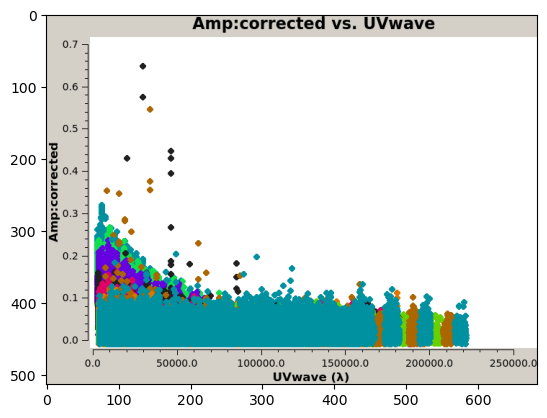

In [66]:
for field in fields.split(","):
    print(field)
    img = mpimg.imread(root + f"/plots/dataplots/{field}_amp_vs_uvdist_corrected.png")
    imgplot = plt.imshow(img)
    plt.show()

3C286


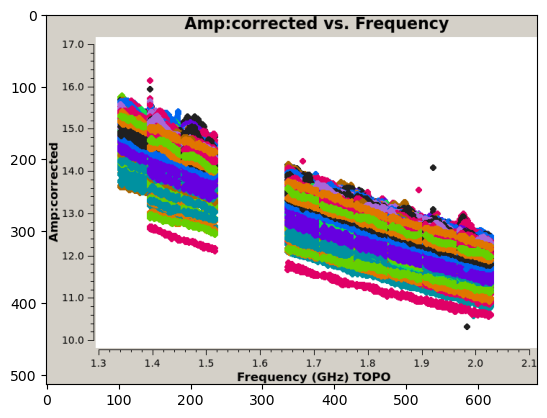

J1745+1720


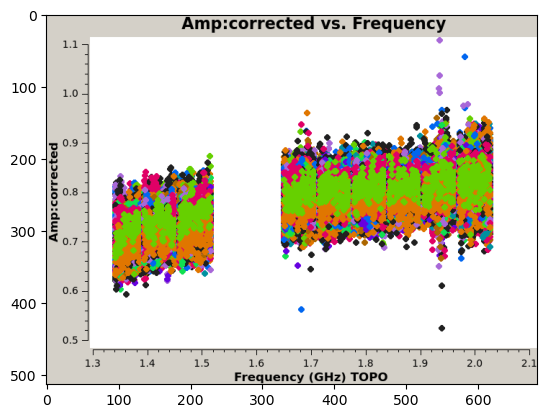

J1609+2641


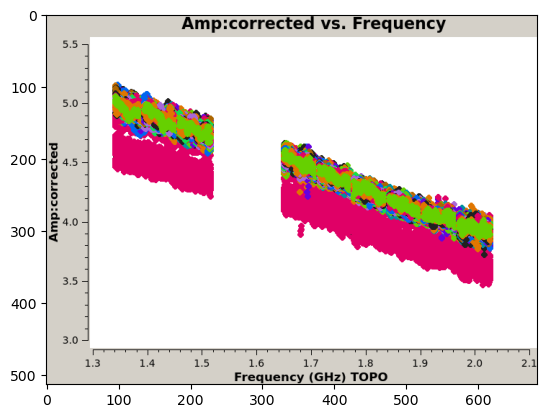

J1635+3808


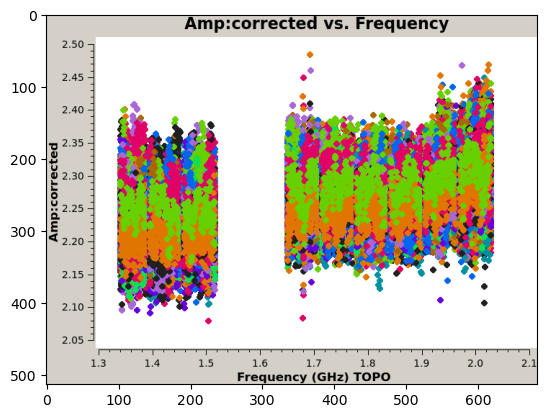

J1506+3730


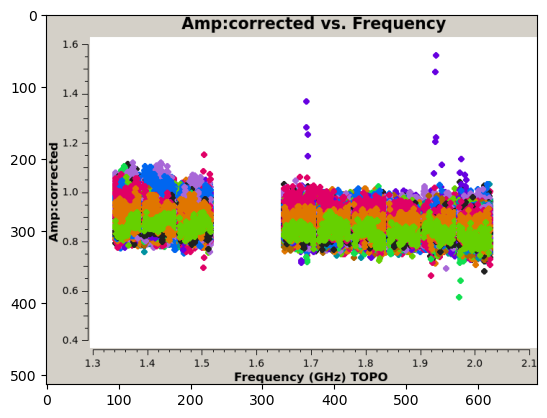

J1549+5038


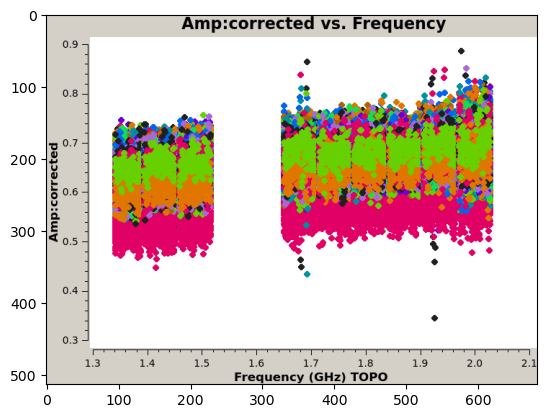

J1927+7358


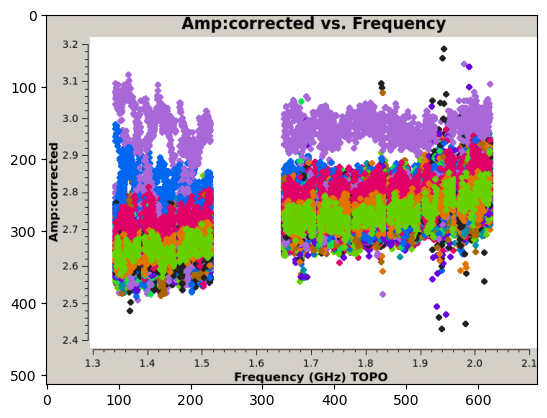

QSO J1724+1901


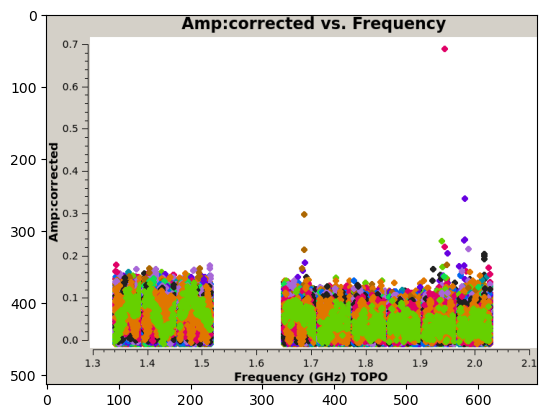

QSO J1629+2407


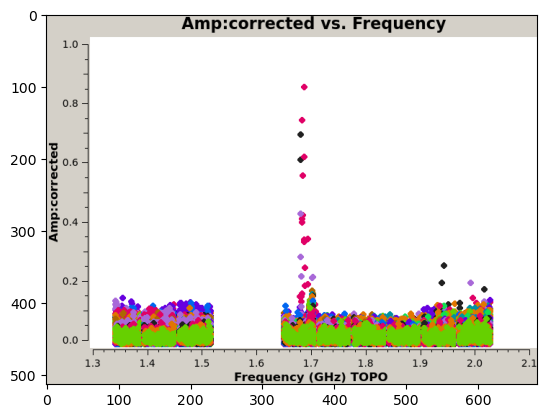

QSO J1559+2212


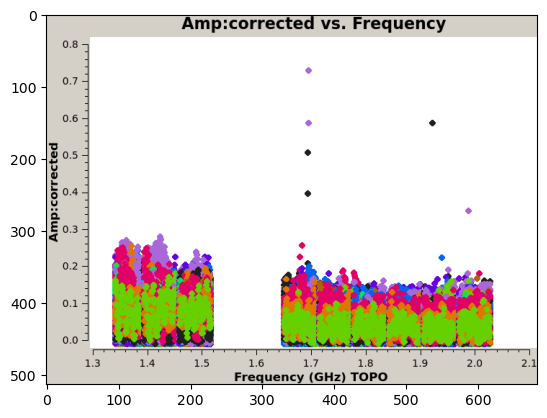

QSO J1609+3041


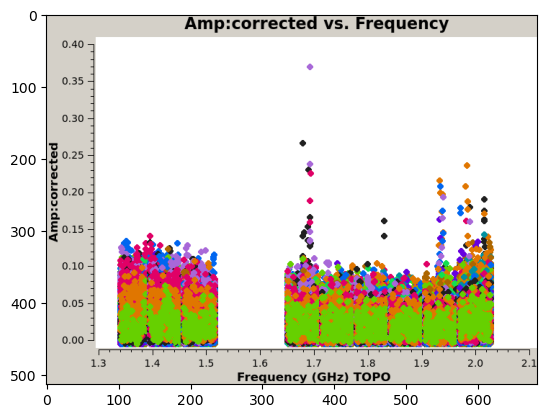

QSO J1623+3112


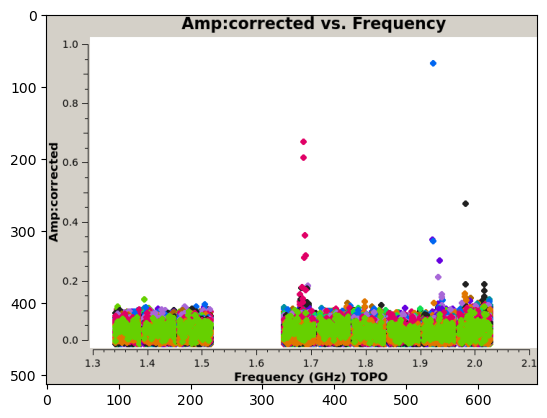

QSO J1641+3755


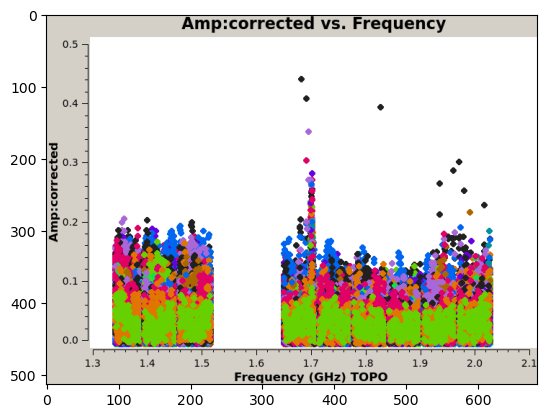

QSO J1630+4012


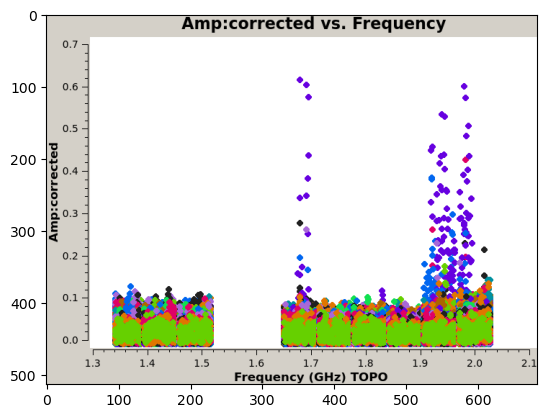

QSO J1602+4228


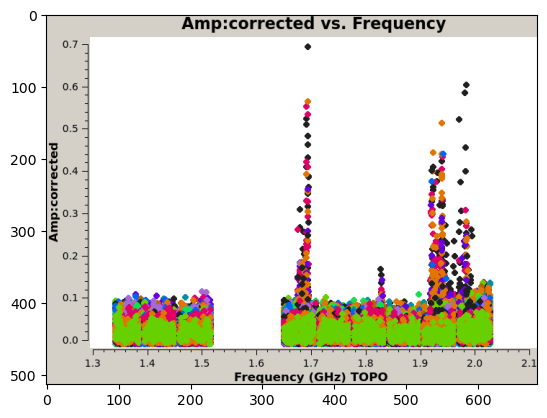

QSO J1525+4303


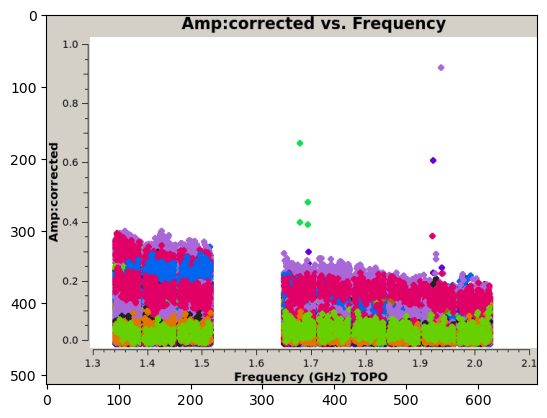

QSO J1516+4228


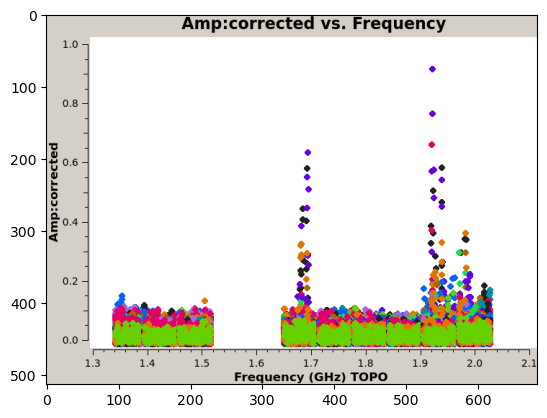

QSO J1512+4422


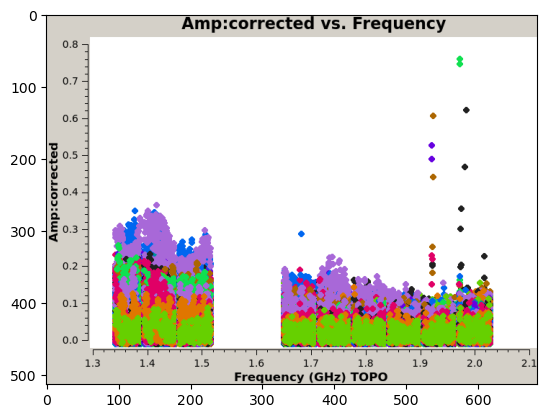

QSO J1609+5328


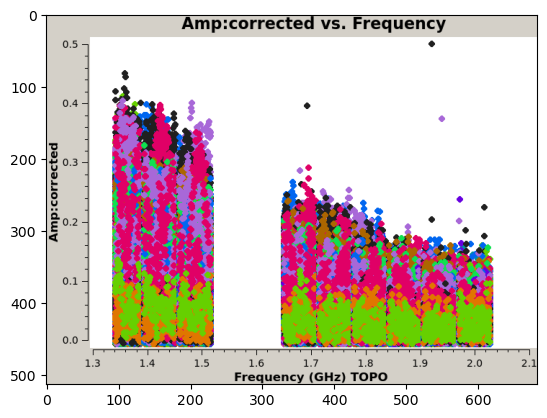

QSO J1603+5510


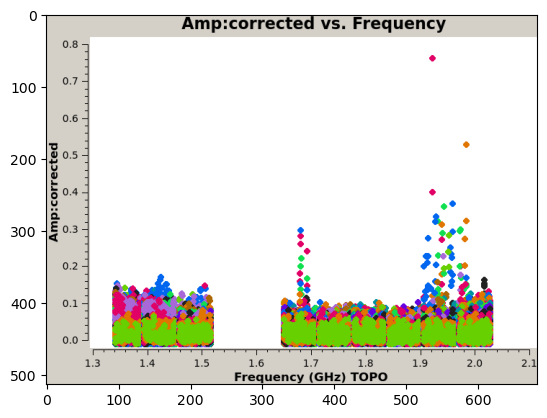

QSO J1612+5559


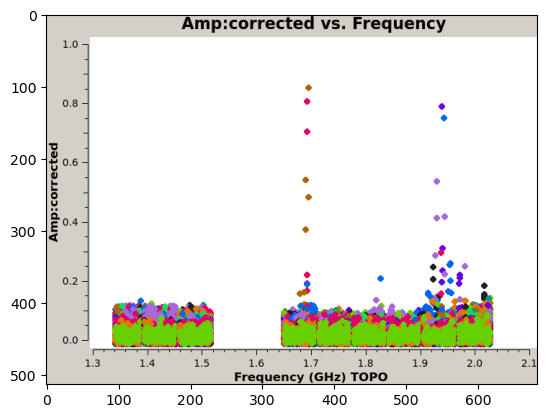

QSO J1932+7139


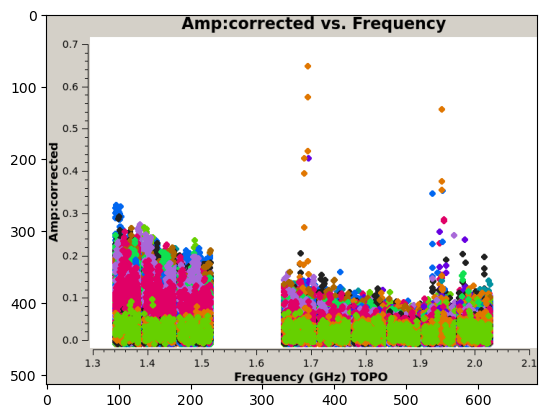

In [67]:
for field in fields.split(","):
    print(field)
    img = mpimg.imread(root + f"/plots/dataplots/{field}_amp_vs_freq_corrected.png")
    imgplot = plt.imshow(img)
    plt.show()

3C286


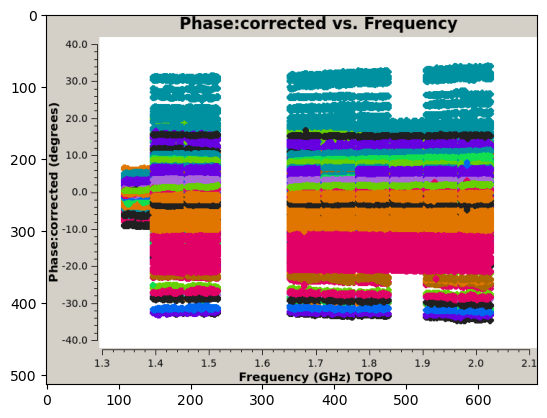

J1745+1720


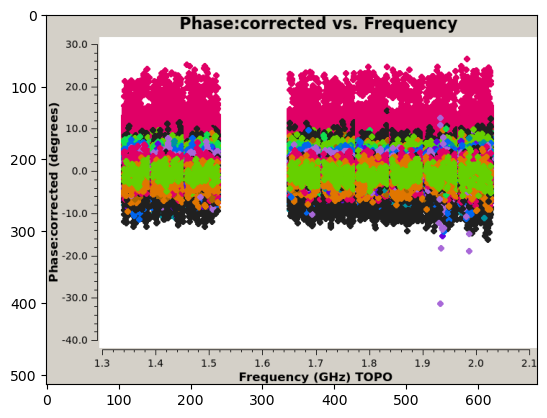

J1609+2641


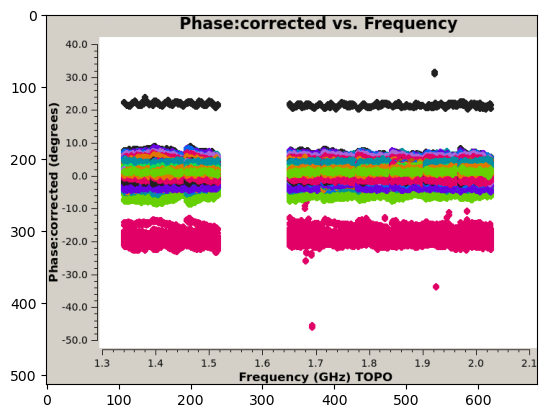

J1635+3808


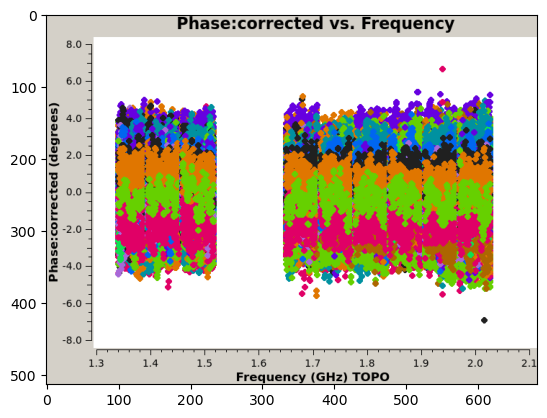

J1506+3730


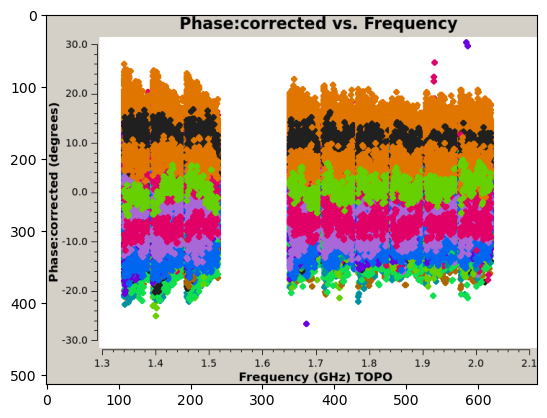

J1549+5038


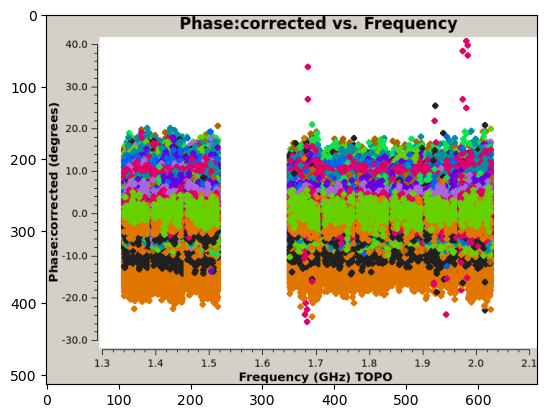

J1927+7358


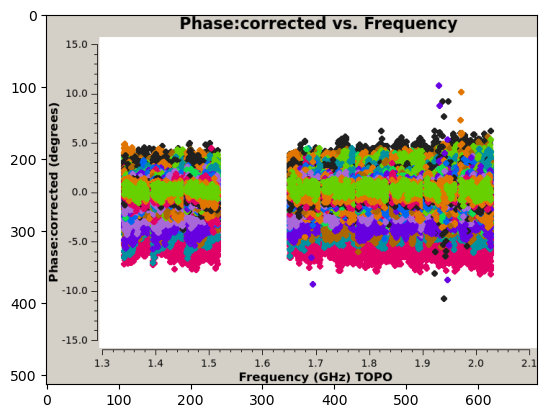

QSO J1724+1901


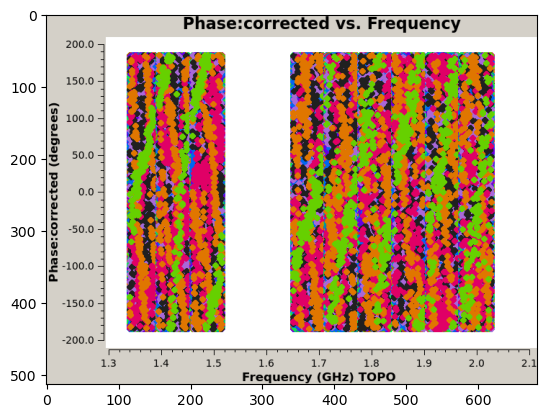

QSO J1629+2407


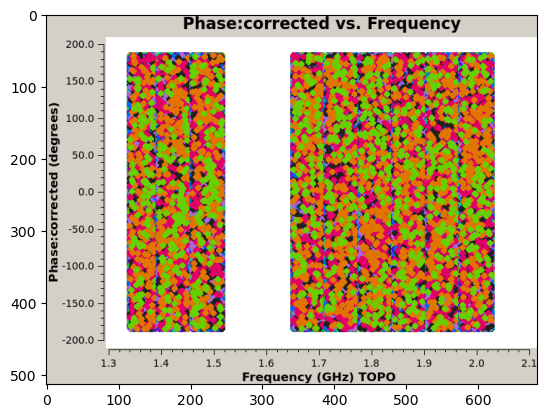

QSO J1559+2212


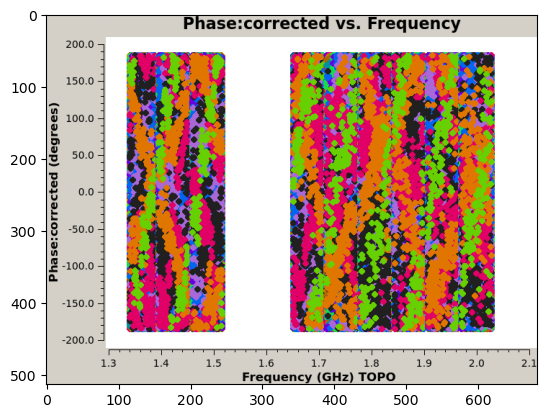

QSO J1609+3041


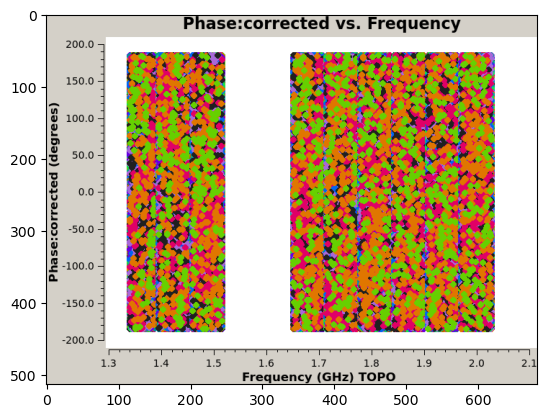

QSO J1623+3112


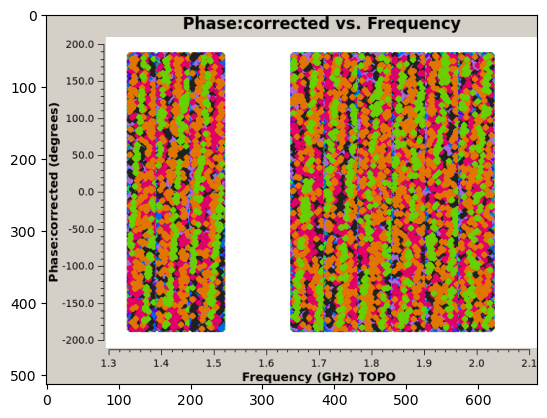

QSO J1641+3755


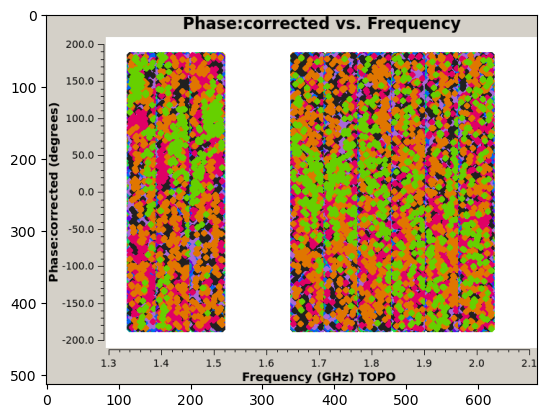

QSO J1630+4012


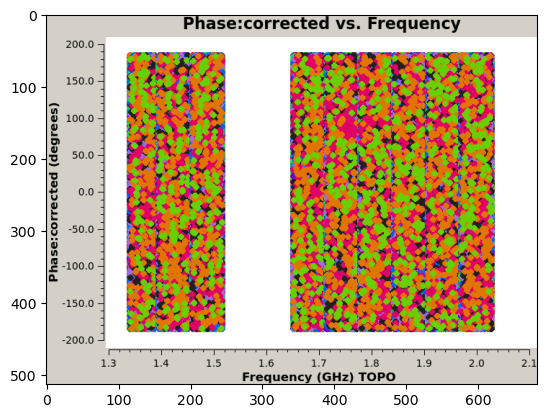

QSO J1602+4228


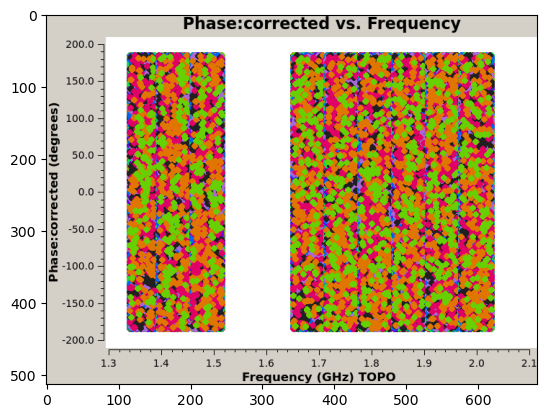

QSO J1525+4303


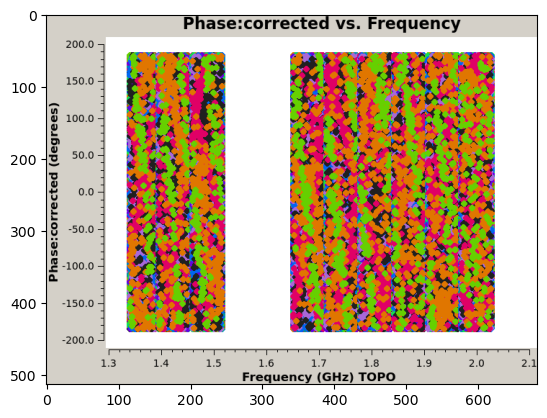

QSO J1516+4228


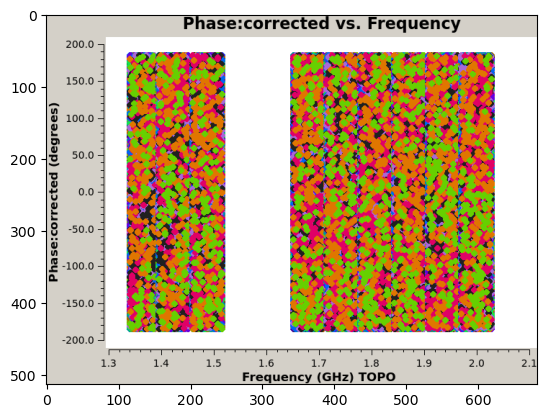

QSO J1512+4422


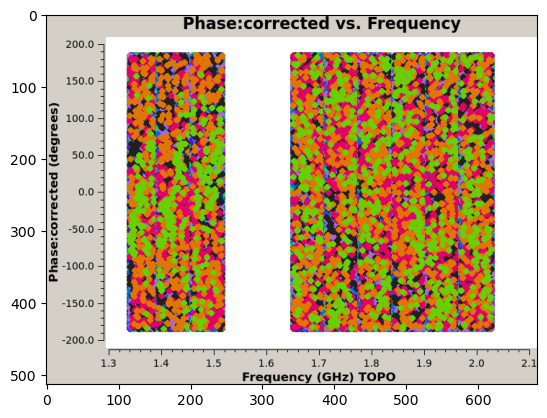

QSO J1609+5328


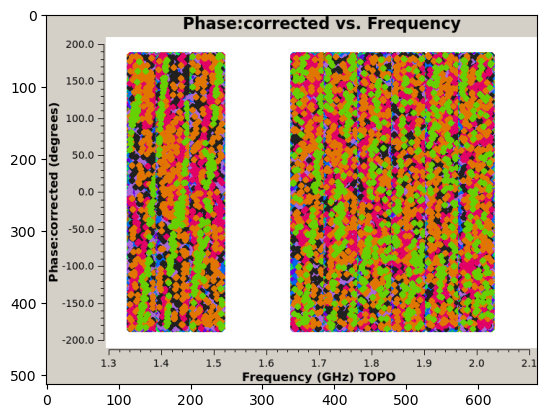

QSO J1603+5510


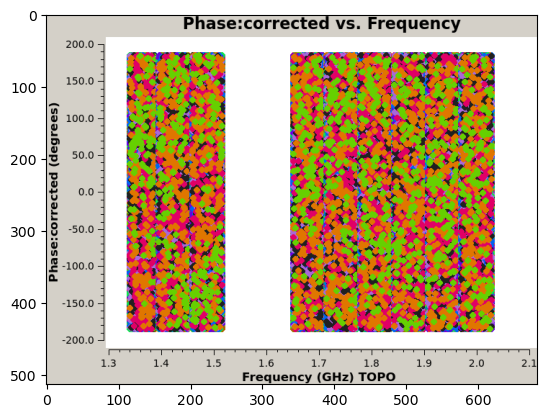

QSO J1612+5559


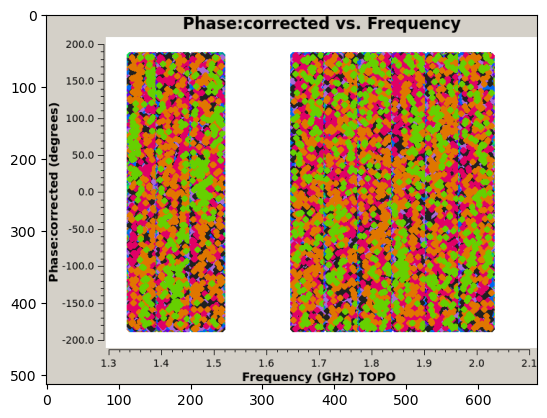

QSO J1932+7139


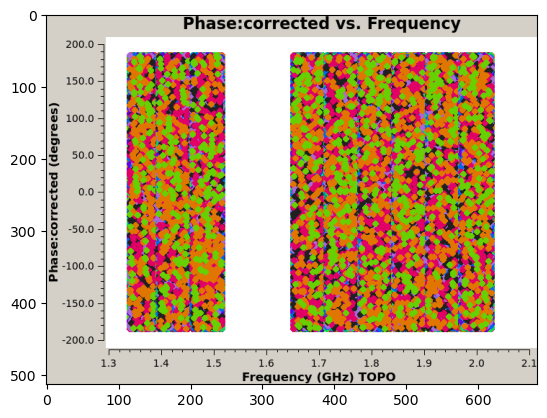

In [68]:
for field in fields.split(","):
    print(field)
    img = mpimg.imread(root + f"/plots/dataplots/{field}_phase_vs_freq_corrected.png")
    imgplot = plt.imshow(img)
    plt.show()

In [69]:

with h5py.File(root + f"/output/z_score_corrected.h5", "r") as f:
    z_score = f["z-score avg"][()]
    flags = f["flags avg"][()]
    freq_array = f["freq array"][()]
    time_array = f["time array"][()]
    ant_pairs = f["ant pairs"][()]
    dt = f["dt"][()]

# Load time integrations per scan
ntimes_file = os.path.join(root, f"output/ntimes.txt")
ntimes = np.loadtxt(ntimes_file).astype(int)

# time array
tisot = np.unique(Time(time_array, format="jd", scale="utc").isot)

z_score = np.ma.masked_array(z_score, mask=flags)

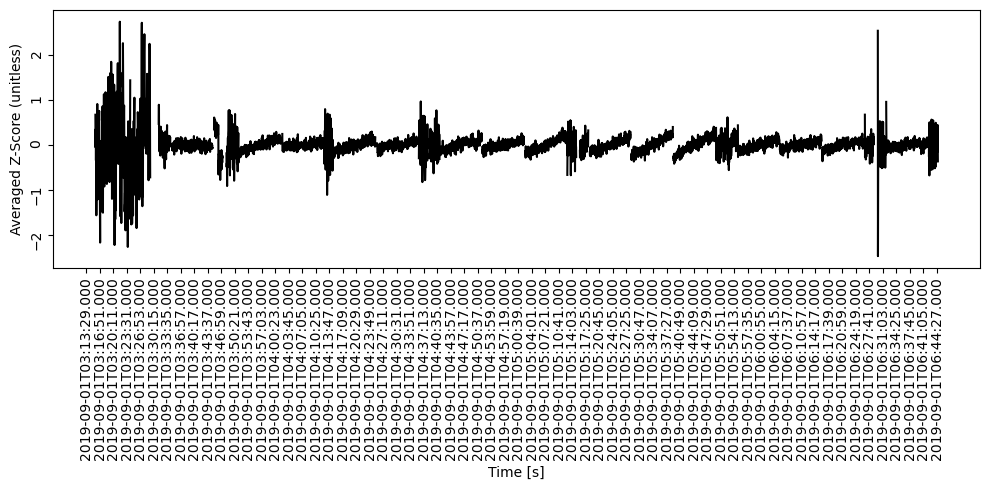

In [70]:
%matplotlib inline
fig, ax = plt.subplots(1, 1, figsize=(10, 5), sharex=True)
ax = inspect.plot_time_series(tisot, np.ma.median(z_score, axis=1), ax, plot_masked=True)
ax.set_ylabel("Averaged Z-Score (unitless)")
ax.set_xticks(tisot[::100])
plt.tight_layout()

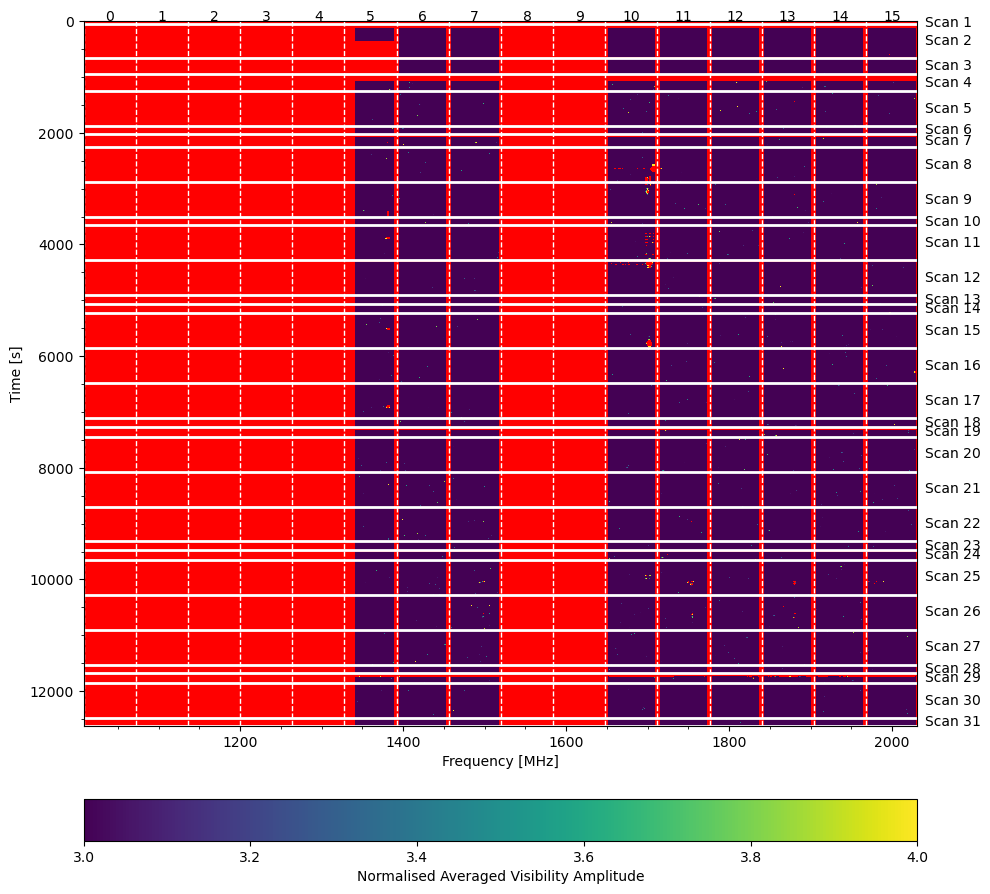

In [71]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(10, 10))
ax, im = inspect.plot_wf(freq_array, z_score, 2, ntimes, vmin=3, vmax=4, cmap=cmap, ax=ax, plot_masked=True)
fig.colorbar(im, orientation="horizontal", pad=0.08, label="Normalised Averaged Visibility Amplitude")